# Clustering and Sentiment Analysis for Fiat 600e Competitors
This script performs sentiment and clustering analysis on customer comments related to competitors of the Fiat 600e. It includes data preprocessing, clustering, and sentiment analysis.

## Import Libraries

In [206]:
import pandas as pd
import numpy as np
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score,davies_bouldin_score
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import seaborn as sns
import string
from nltk.sentiment import SentimentIntensityAnalyzer
from textblob import TextBlob
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer
from bertopic import BERTopic
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS
import plotly.graph_objects as go
import re
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from collections import Counter
from kneed import KneeLocator
from sklearn.cluster import AgglomerativeClustering
from sklearn.manifold import TSNE
from nltk.stem import PorterStemmer
from matplotlib.dates import DateFormatter

## Initialize NLTK Components

In [207]:
# Initialize NLTK components
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('vader_lexicon')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\atani\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\atani\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\atani\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

## Define Custom Stopwords

In [208]:
# Define custom stopwords
custom_stopwords = set(stopwords.words('english')).union({
    'car', 'cars',  'combined', 'hyundai', 'kona', 'stellantis', 'market', 'available', 'jeep', 'tesla', 'niro', 'mokka', 'vauxhall',  'cooper',
    'would', 'also', 'new', 'level', 'like', 'even', 'according', 'offered', 'move',
    'one', 'content', 'information', 'interests', 'activity', 'mean', 'go', 'quit',
    'got', 'much', 'actual', 'thing', 'bit', 'see', 'think', 'yeah', 'know', 'and', 
    'way', 'come', 'presented', 'example', 'esposito', 'lee', 'torque', 'ready', 
    'since', 'still', 'two', 'sold', 'week', 'sherpa', 'around', 'use', 'um', 
    'together', 'us', 'really', 'america', 'well', 'mirafiori', 'campaign', 'north',
    'sales', 'bag', 'says', 'get', 'world', 'germani', 'belgium', 'spain',
    'uh', 'oh', 'im', 'thats', 'youre', 'weve', 'dont', 'actually', 'ahmed', 'work', 'reuters','youve','there','going',
    'gelateria', 'list', 'required', 'instead', 'added', 'inbox', 'honda', 'help', 'dedicated',
    'inform', 'news', 'group', 'report', 'couldnt', 'three', 'including', 'however', 'people', 'review', 'avenger','wave','bmw',
    'want','cant','though','chinese'
})
custom_stopwords = list(custom_stopwords)  # Convert the set to a list

# Function to preprocess the text
def preprocess(text):
    if pd.isna(text):
        return ''  # Handle NaN values
    text = text.lower()  # Convert to lowercase
    text = text.translate(str.maketrans('', '', string.punctuation))  # Remove punctuation
    tokens = word_tokenize(text)  # Tokenize
    tokens = [word for word in tokens if word not in custom_stopwords and word.isalpha()]  # Remove stopwords
    return ' '.join(tokens)

## Optimal Number of Clusters Function

In [209]:
# Function to find the optimal number of clusters using multiple methods
def find_optimal_clusters(X, max_k=8):
    inertia = []
    silhouette = []
    davies_bouldin = []

    # Elbow Method, Silhouette Score, and Davies-Bouldin Index
    for k in range(2, max_k + 1):
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        inertia.append(kmeans.inertia_)
        silhouette.append(silhouette_score(X, kmeans.labels_))
        davies_bouldin.append(davies_bouldin_score(X, kmeans.labels_))

    # Plot the results
    plt.figure(figsize=(16, 8))

    plt.subplot(1, 3, 1)
    plt.plot(range(2, max_k + 1), inertia, marker='o')
    plt.title('Elbow Method')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Inertia')

    plt.subplot(1, 3, 2)
    plt.plot(range(2, max_k + 1), silhouette, marker='o')
    plt.title('Silhouette Score')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')

    plt.subplot(1, 3, 3)
    plt.plot(range(2, max_k + 1), davies_bouldin, marker='o')
    plt.title('Davies-Bouldin Index')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Davies-Bouldin Index')

    plt.tight_layout()
    plt.show()

    # Determine the "elbow" point using the KneeLocator
    knee_locator = KneeLocator(range(2, max_k + 1), inertia, curve="convex", direction="decreasing")
    elbow_k = knee_locator.elbow
    
    # Determine the optimal number of clusters using a combined approach
    optimal_k = {
        'Elbow': elbow_k,
        'Silhouette': silhouette.index(max(silhouette)) + 2,
        'Davies-Bouldin': davies_bouldin.index(min(davies_bouldin)) + 2
    }

    print(f"Optimal k values determined by different methods: {optimal_k}")
    return optimal_k

## N-grams Plotting, Clusters Visualization, Top Keywords Extraction , Word Clouds Generation for Clusters, Analyze Sentiment and Subjectivity of Cluster Text, Integrate Features and Perform Clustering Analysis Function

In [210]:
# Function to plot the most common n-grams
def plot_ngrams(corpus, ngram_range=(1, 1), top_n=10, title="Top N-grams"):
    vec = CountVectorizer(ngram_range=ngram_range, stop_words=custom_stopwords).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)[:top_n]
    
    words, freqs = zip(*words_freq)
    plt.figure(figsize=(10, 5))
    sns.barplot(x=list(freqs), y=list(words))
    plt.title(title)
    plt.xlabel('Frequency')
    plt.ylabel('N-grams')
    plt.show()

# Function to visualize clusters using a scatter plot
def plot_clusters(X, labels, title="Cluster Plot"):
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette="viridis", s=100, alpha=0.7)
    plt.title(title)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.legend(title="Cluster")
    plt.show()


# Function to extract top keywords for each cluster
def extract_top_keywords(car_data, cluster_col='Cluster', n_keywords=10):
    top_keywords = {}
    for cluster in car_data[cluster_col].unique():
        cluster_data = car_data[car_data[cluster_col] == cluster]
        all_words = ' '.join(cluster_data['Processed_Text']).split()
        word_freq = Counter(all_words)
        top_keywords[cluster] = word_freq.most_common(n_keywords)
    return top_keywords

# Function to generate word clouds for each cluster
def generate_wordclouds(car_data, cluster_col='Cluster'):
    for cluster in car_data[cluster_col].unique():
        cluster_data = car_data[car_data[cluster_col] == cluster]
        all_words = ' '.join(cluster_data['Processed_Text'])
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_words)
        
        # Plotting the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"Word Cloud for Cluster {cluster}")
        plt.show()

# Function to analyze sentiment and subjectivity of cluster text
def analyze_cluster_text(car_data, cluster_col='Cluster'):
    analysis_results = {}
    for cluster in car_data[cluster_col].unique():
        cluster_data = car_data[car_data[cluster_col] == cluster]
        subjectivity_scores = cluster_data['Processed_Text'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

        # Extract positive and negative keywords
        positive_keywords = []
        negative_keywords = []
        for text in cluster_data['Processed_Text']:
            blob = TextBlob(text)
            words = blob.words
            sentiment = blob.sentiment.polarity
            if sentiment > 0:
                positive_keywords.extend(words)
            elif sentiment < 0:
                negative_keywords.extend(words)

        analysis_results[cluster] = {
            'Average Subjectivity': np.mean(subjectivity_scores),
            'Positive Keywords': Counter(positive_keywords).most_common(10),
            'Negative Keywords': Counter(negative_keywords).most_common(10)
        }
    return analysis_results

# Integrate new features into the existing clustering function
def perform_clustering_and_analyze_text(data, car_name, max_k=8):
    car_data = data[data['Car'] == car_name]
    
    # Preprocess the text
    car_data['Processed_Text'] = car_data['Text'].apply(preprocess)
    
    # Check if there are any non-empty documents
    if car_data['Processed_Text'].str.strip().eq('').all():
        raise ValueError(f'No valid text data for {car_name}. All documents may be empty or contain only stop words.')
    
    # Plot n-grams
    plot_ngrams(car_data['Processed_Text'], ngram_range=(1, 1), top_n=10, title=f"Top 10 Unigrams for {car_name}")
    plot_ngrams(car_data['Processed_Text'], ngram_range=(2, 2), top_n=10, title=f"Top 10 Bigrams for {car_name}")
    plot_ngrams(car_data['Processed_Text'], ngram_range=(3, 3), top_n=10, title=f"Top 10 Trigrams for {car_name}")

    # Vectorize the text data using TF-IDF
    vectorizer = TfidfVectorizer(max_features=1000, ngram_range=(1, 2))  # Adjusted ngram_range
    X = vectorizer.fit_transform(car_data['Processed_Text'])
    
    # Check if the TF-IDF matrix is empty
    if X.shape[0] == 0:
        raise ValueError(f'Empty TF-IDF matrix for {car_name}. This might be due to empty or stopword-filtered documents.')

    # Dimensionality Reduction using PCA
    pca = PCA(n_components=0.85, random_state=42)  # Adjusted n_components
    X_reduced = pca.fit_transform(X.toarray())

    # Optional: Use t-SNE or UMAP for further reduction
    tsne = TSNE(n_components=2, random_state=42)
    X_tsne = tsne.fit_transform(X_reduced)
    
    # Find the optimal number of clusters using the updated method
    optimal_ks = find_optimal_clusters(X_tsne, max_k)
    selected_k = max(set(optimal_ks.values()), key=list(optimal_ks.values()).count)  # Majority vote

    print(f'Selected optimal number of clusters for {car_name}: {selected_k}')
    
    # Perform clustering with the selected number of clusters
    kmeans = KMeans(n_clusters=selected_k, random_state=42)
    car_data['Cluster'] = kmeans.fit_predict(X_tsne)
    
    # Plot clusters
    plot_clusters(X_tsne, car_data['Cluster'], title=f"Cluster Plot for {car_name}")

    # Generate word clouds for each cluster
    generate_wordclouds(car_data)
    
    # Extract top keywords for each cluster
    top_keywords = extract_top_keywords(car_data)
    
    # Analyze subjectivity and sentiment keywords
    text_analysis = analyze_cluster_text(car_data)
    
    # Get top comments and sentiment scores for each cluster
    top_comments = {}
    sentiment_scores = {}
    for cluster in range(selected_k):
        cluster_comments = car_data[car_data['Cluster'] == cluster]['Text'].tolist()
        top_comments[cluster] = cluster_comments[:15]  # Get top 15 comments
        
        
        # Initialize VADER sentiment analyzer
        sia = SentimentIntensityAnalyzer()
        # Calculate sentiment scores
        sentiment = [sia.polarity_scores(comment)['compound'] for comment in cluster_comments]
        avg_sentiment = sum(sentiment) / len(sentiment) if sentiment else 0
        sentiment_scores[cluster] = avg_sentiment
    
    return car_data, top_comments, sentiment_scores, top_keywords, text_analysis




## Dataset Loading

In [211]:
# Load the dataset
competitors_data = pd.read_csv(r'C:\Users\atani\OneDrive - City, University of London\Tanisha\ARP\competitor_comments_combined_cleaned (1).csv')

# Ensure all values in the 'Text' column are strings and handle missing values
competitors_data['Text'] = competitors_data['Text'].astype(str).fillna('')

# List of car names in your dataset
car_names = competitors_data['Car'].unique()
# Filter out NaN car names
car_names = [name for name in car_names if pd.notna(name)]

## Analysis

Processing Jeep Avenger...


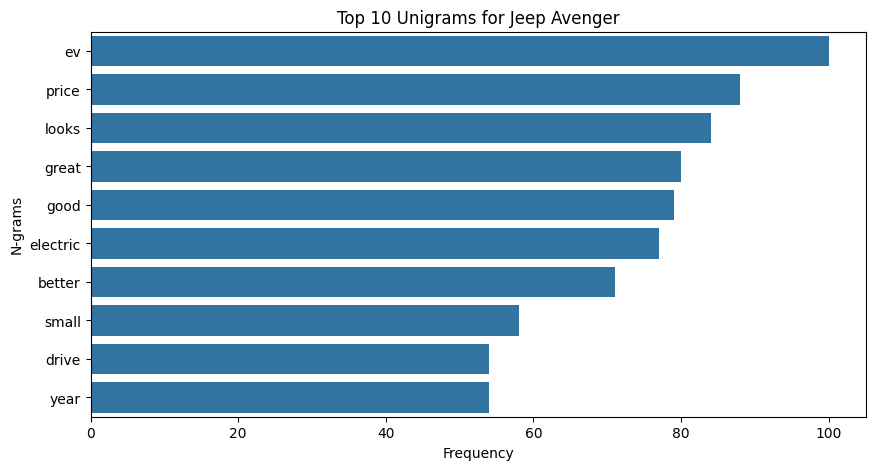

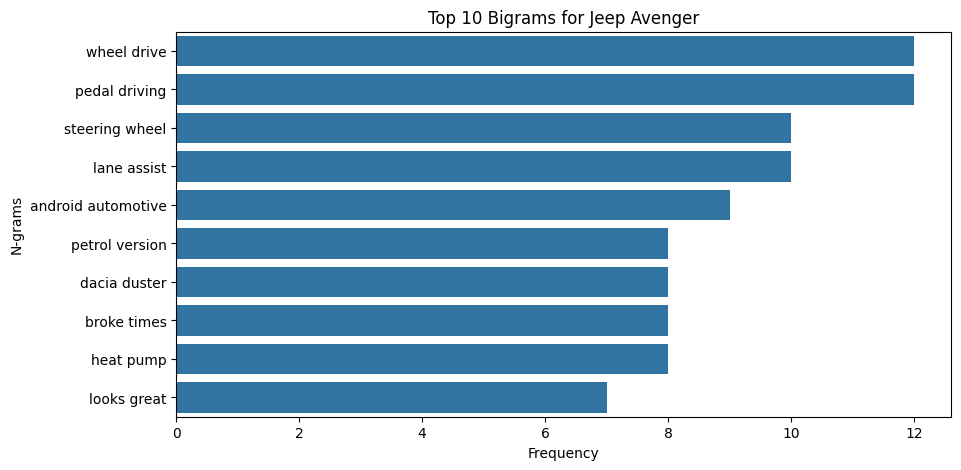

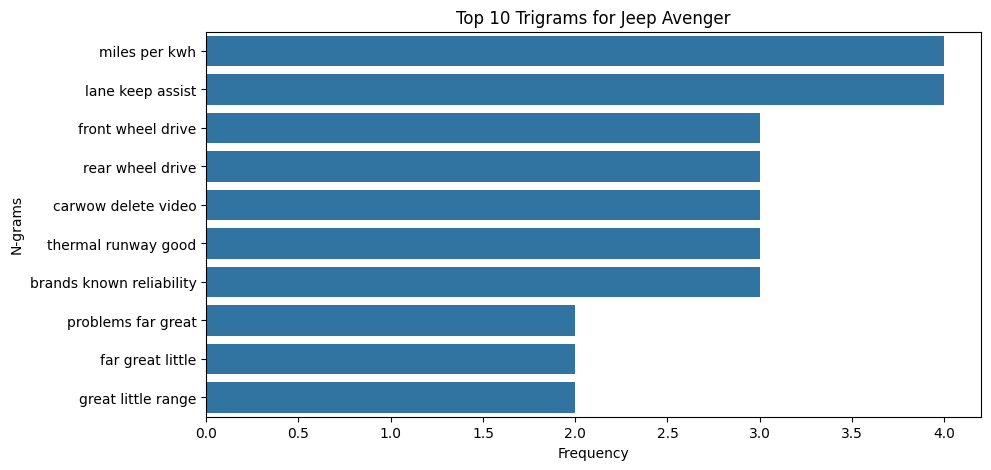

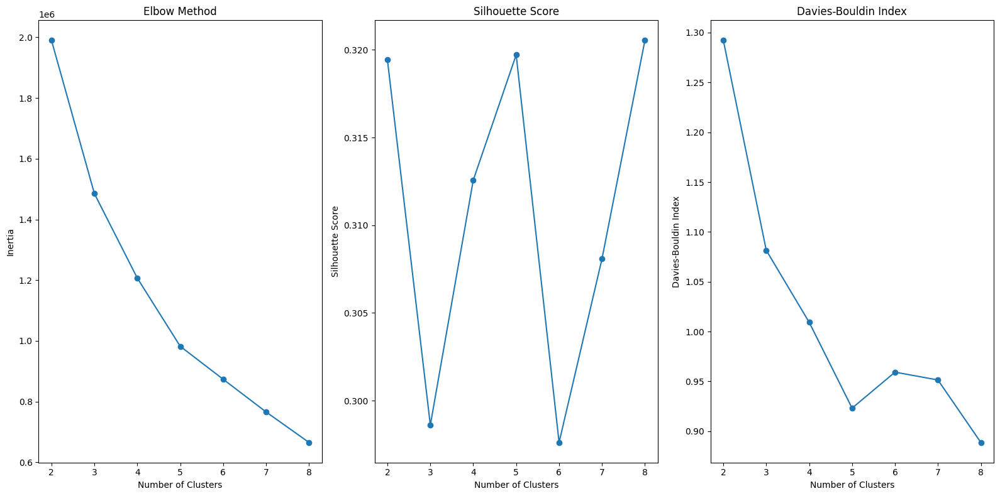

Optimal k values determined by different methods: {'Elbow': 5, 'Silhouette': 8, 'Davies-Bouldin': 8}
Selected optimal number of clusters for Jeep Avenger: 8


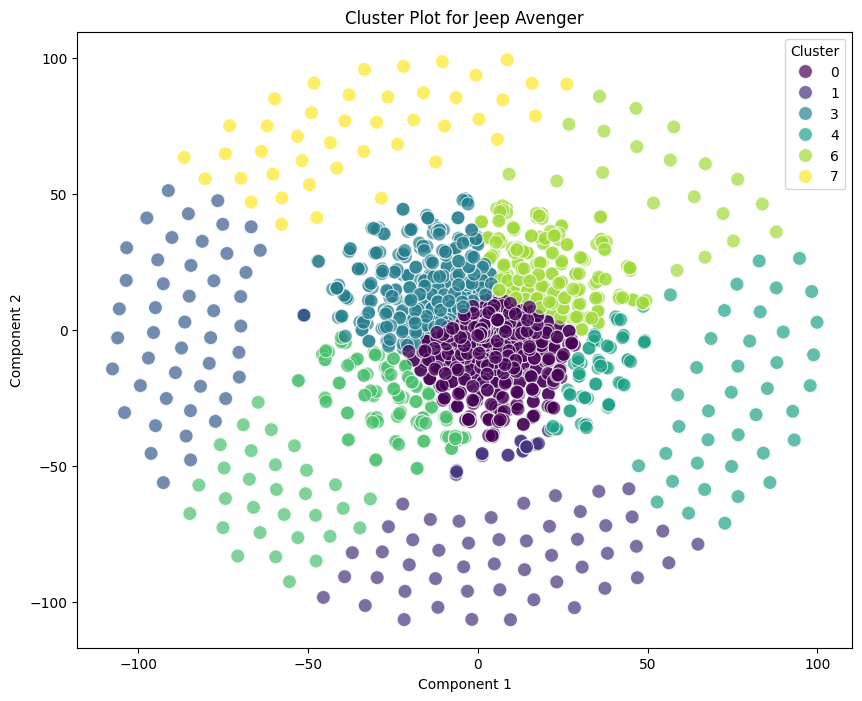

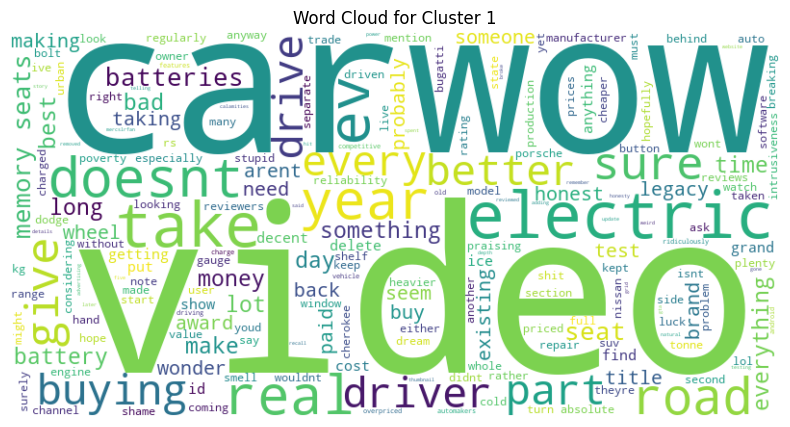

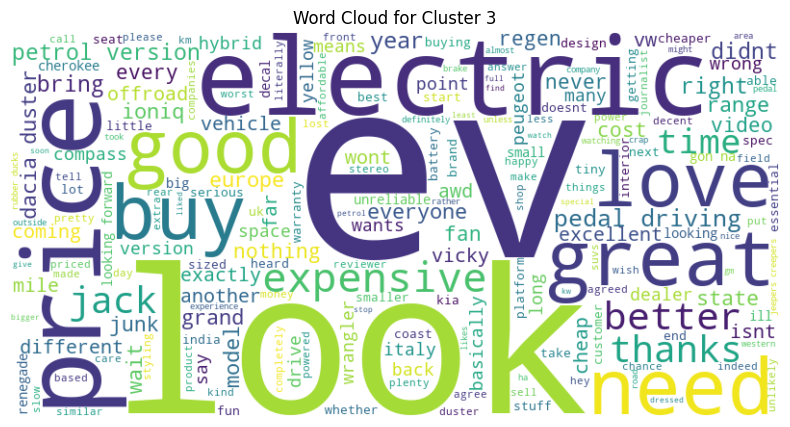

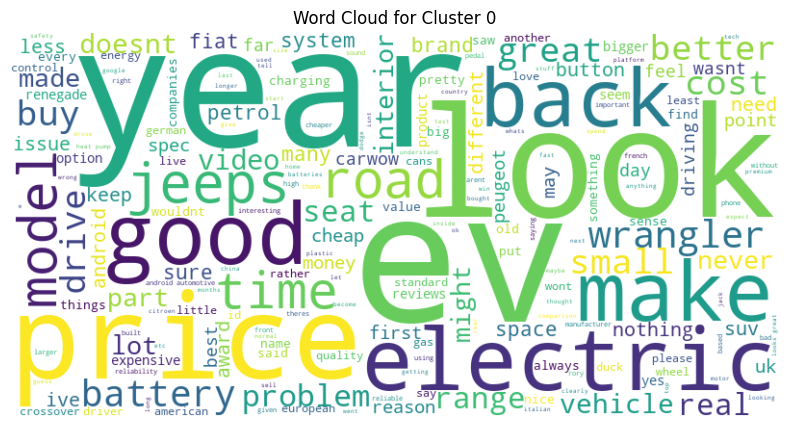

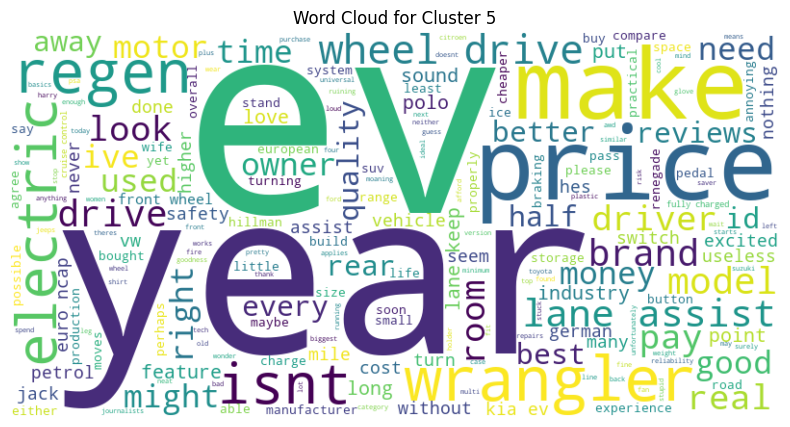

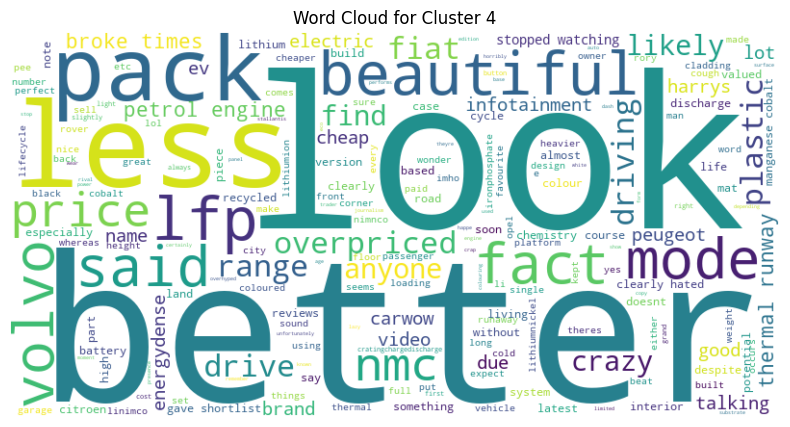

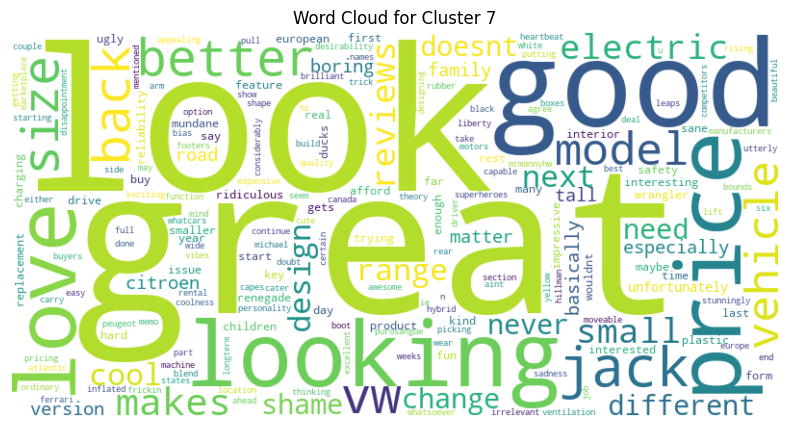

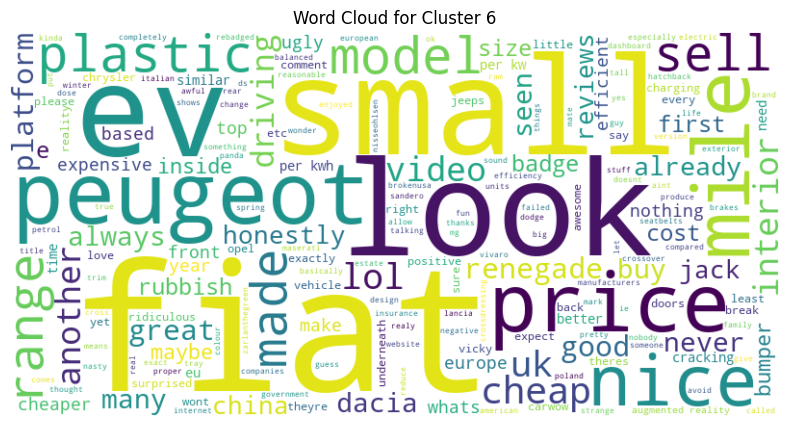

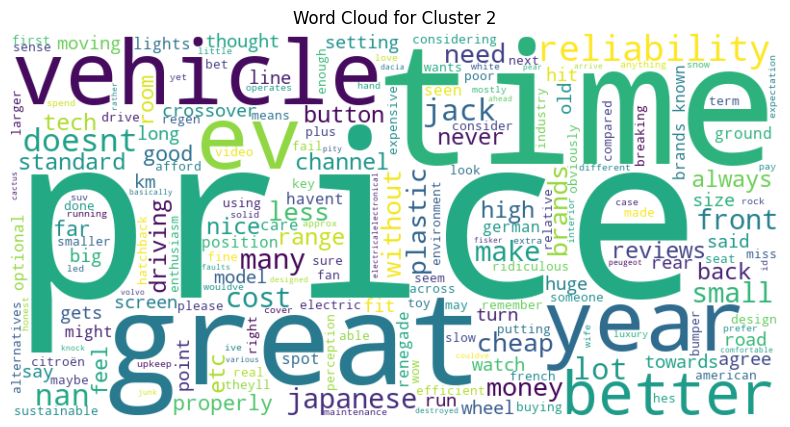

Processing Hyundai Kona...


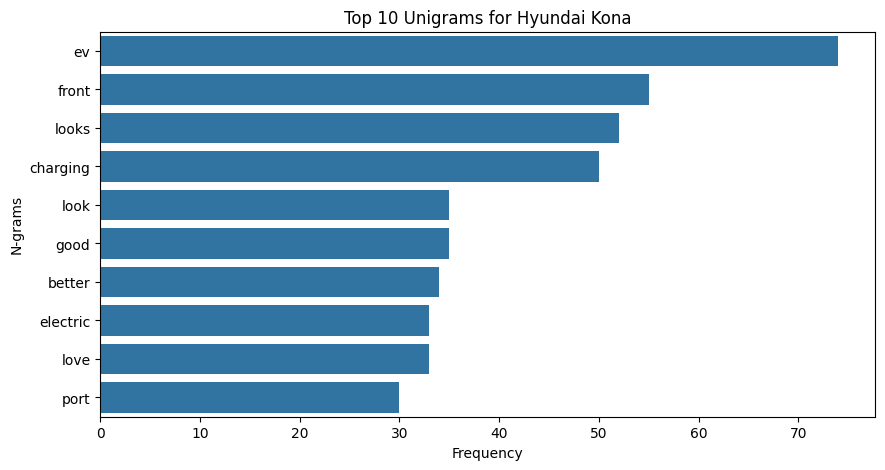

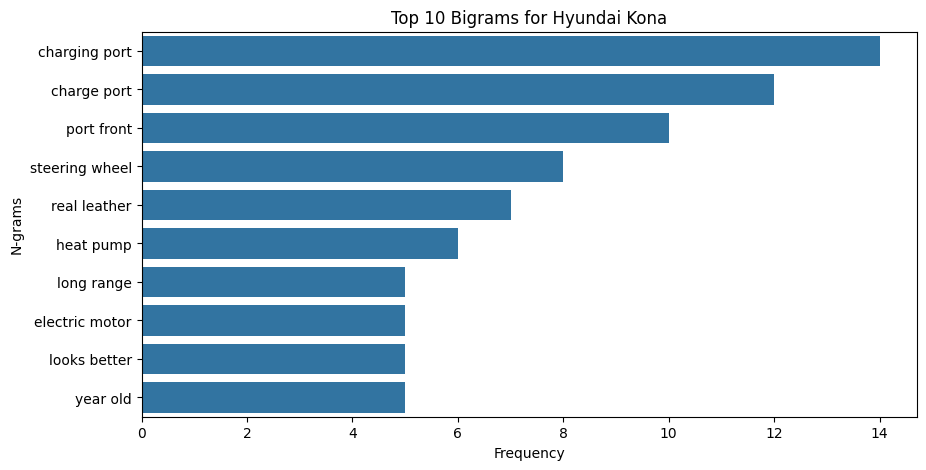

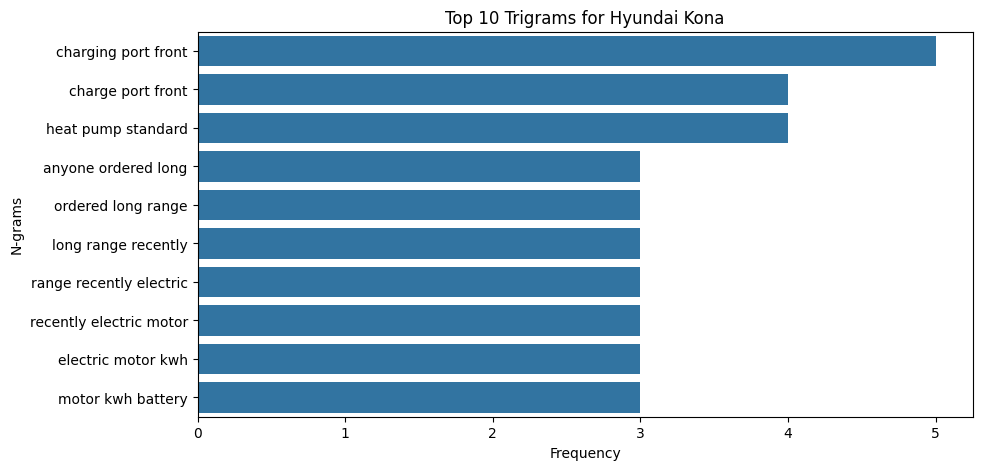

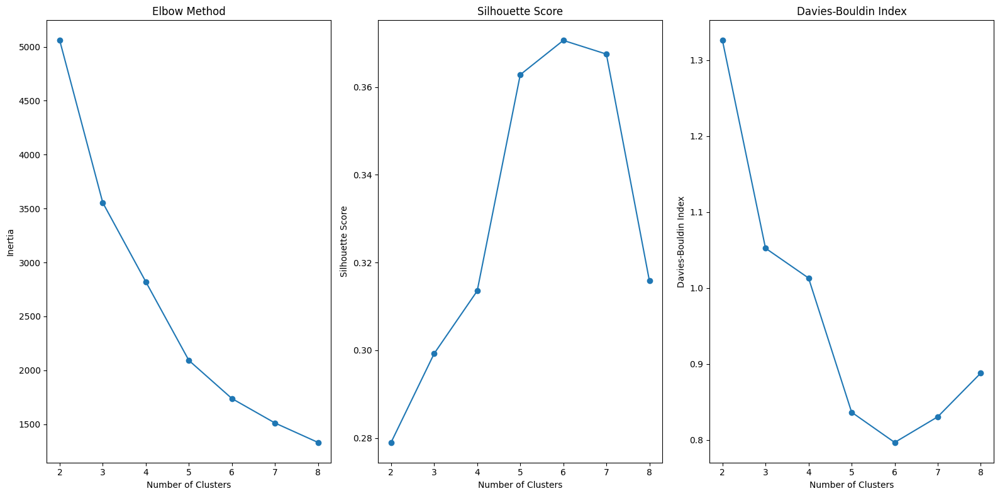

Optimal k values determined by different methods: {'Elbow': 5, 'Silhouette': 6, 'Davies-Bouldin': 6}
Selected optimal number of clusters for Hyundai Kona: 6


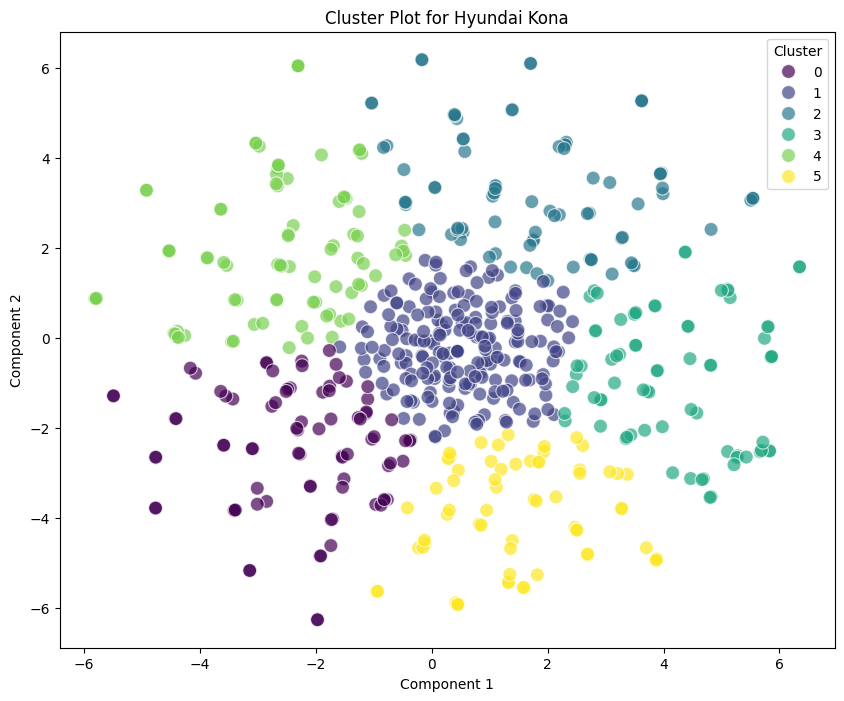

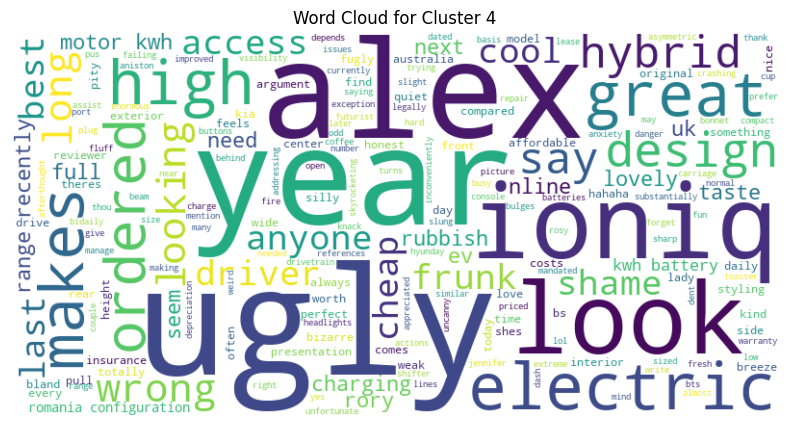

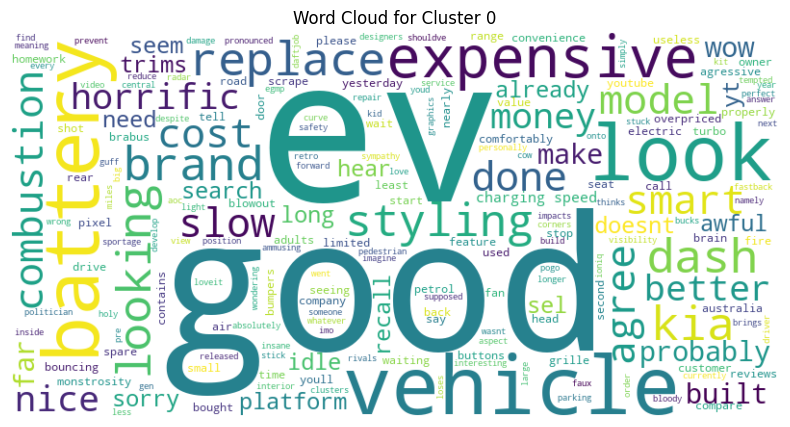

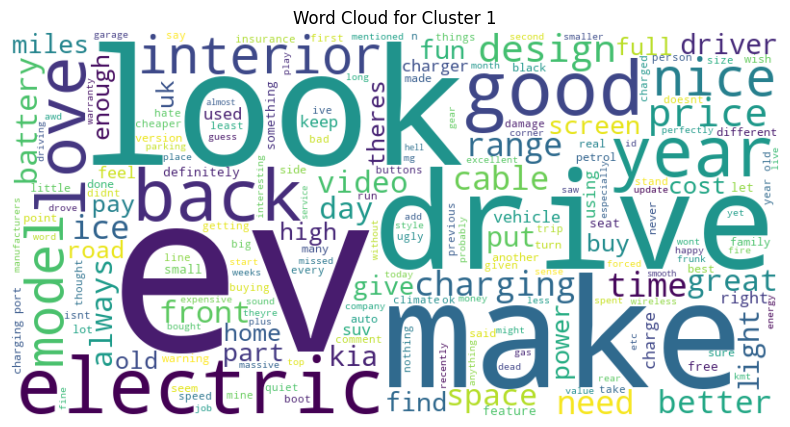

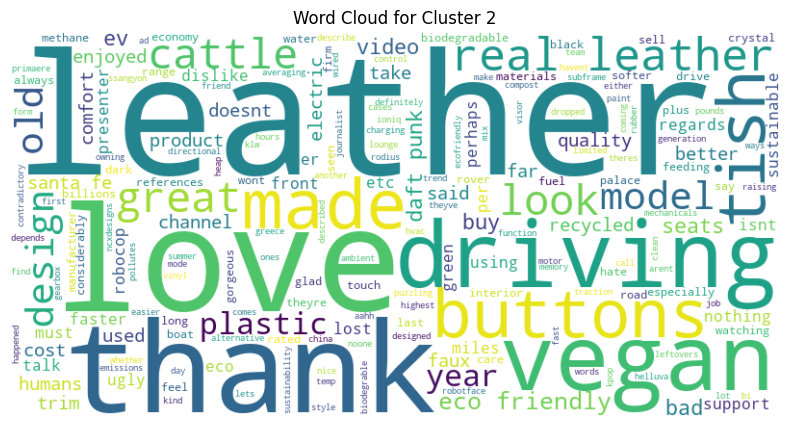

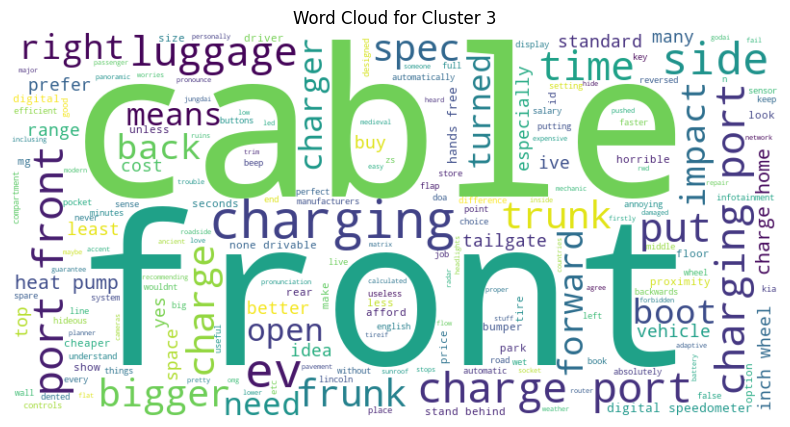

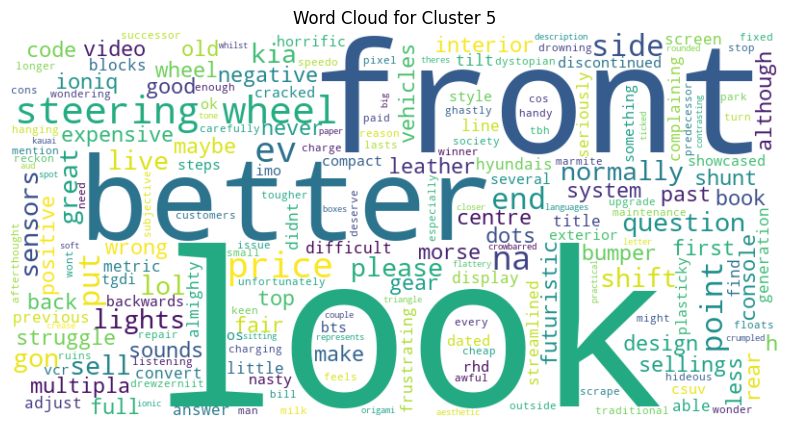

Processing Peugeot e2008...


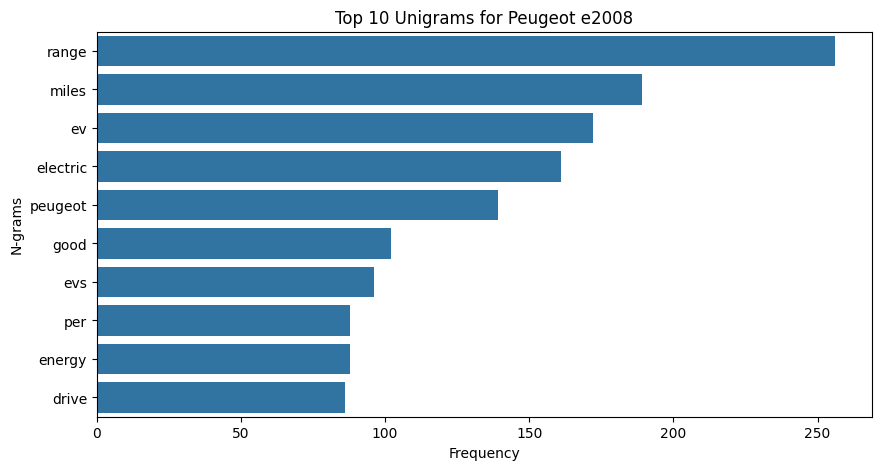

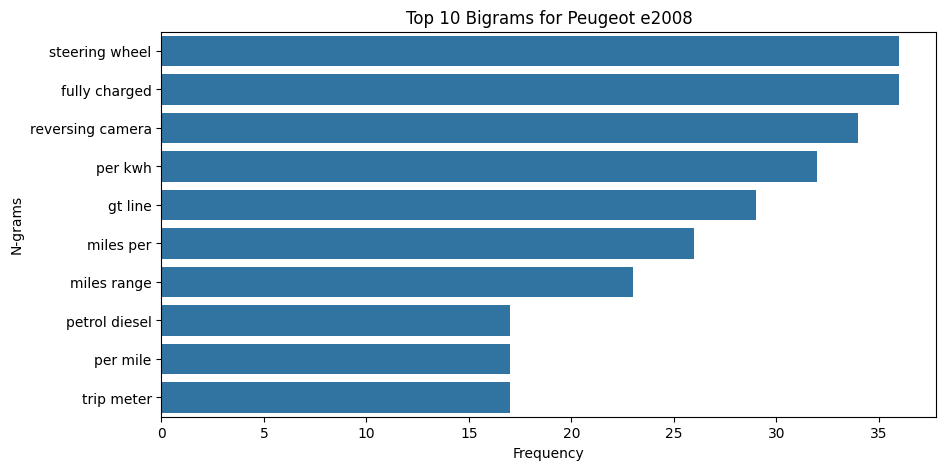

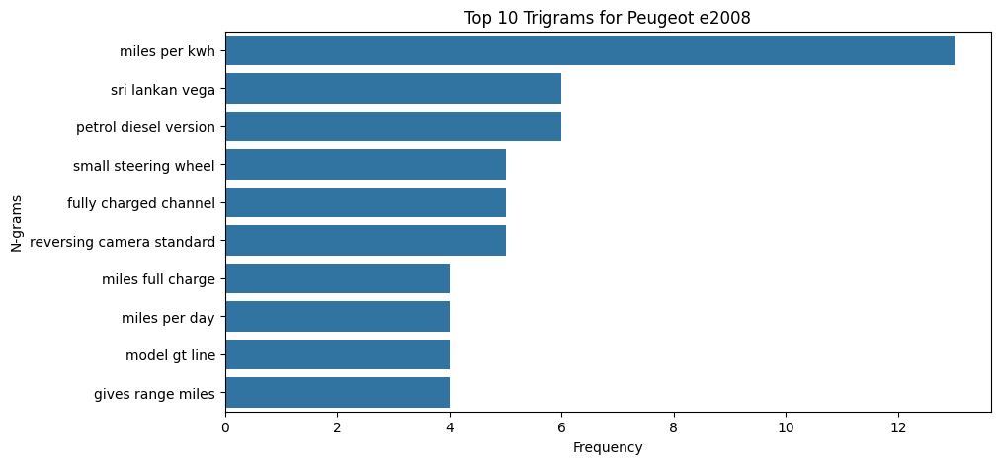

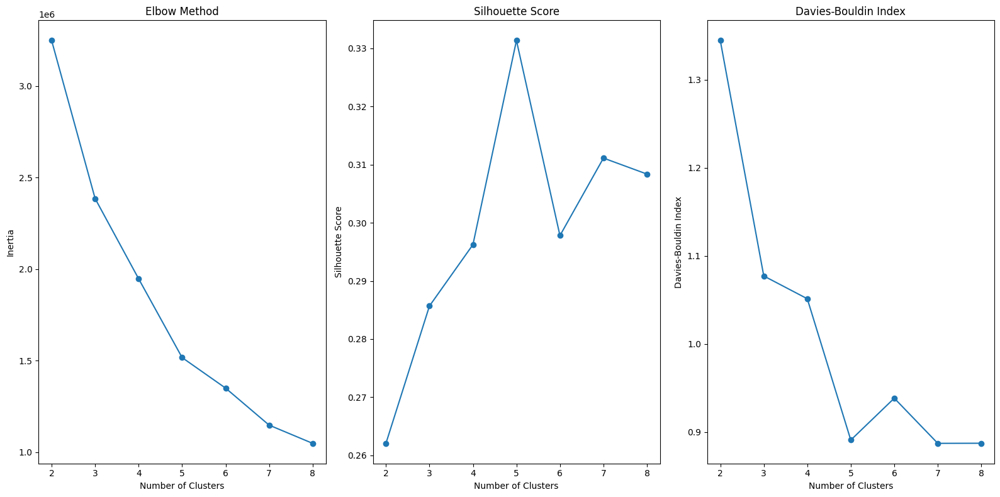

Optimal k values determined by different methods: {'Elbow': 5, 'Silhouette': 5, 'Davies-Bouldin': 7}
Selected optimal number of clusters for Peugeot e2008: 5


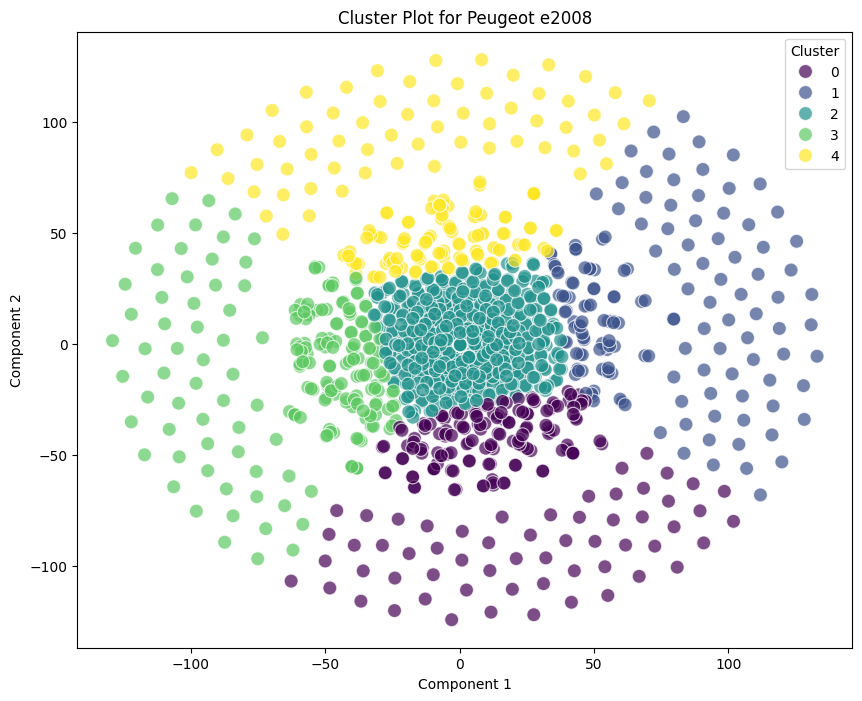

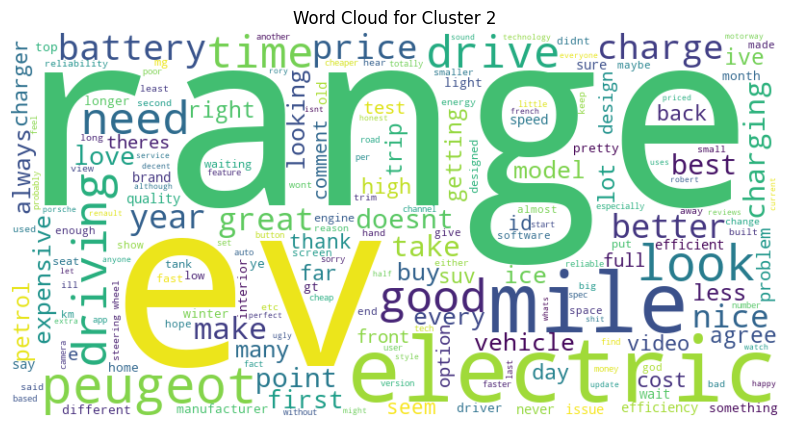

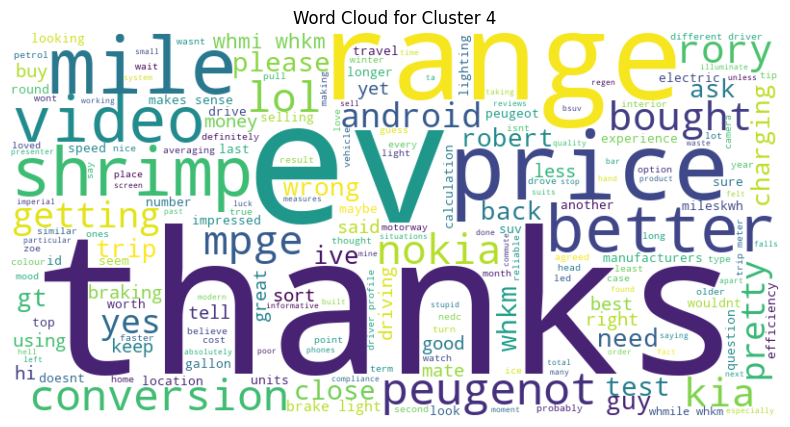

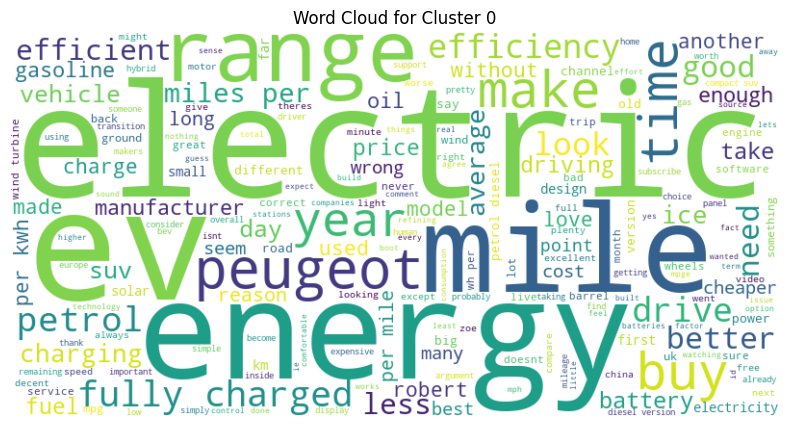

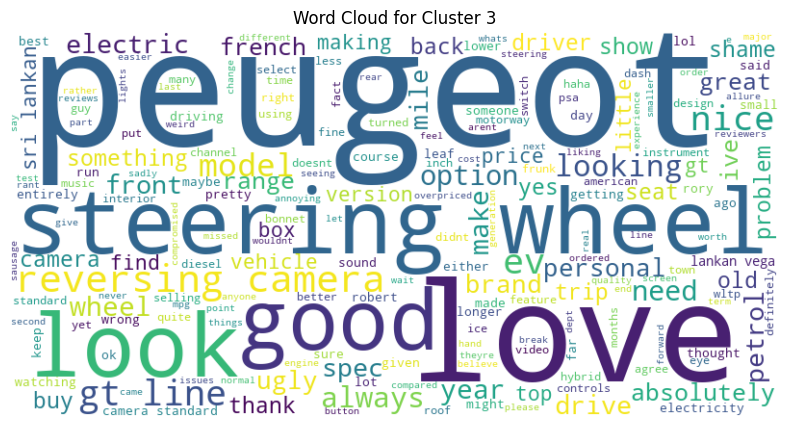

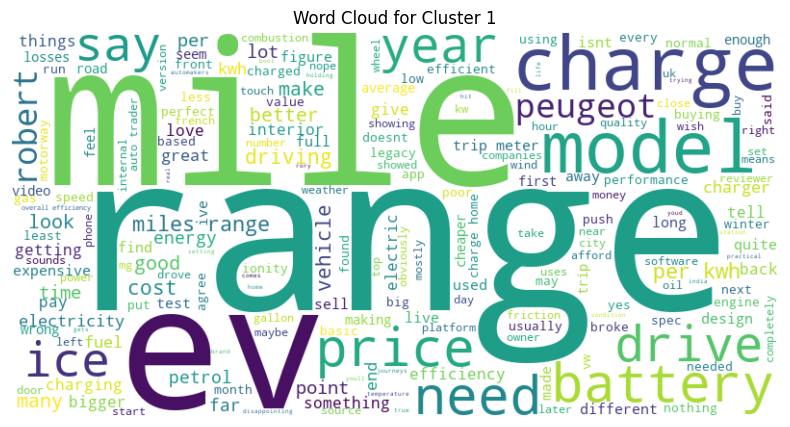

Processing Vauxhall Mokka...


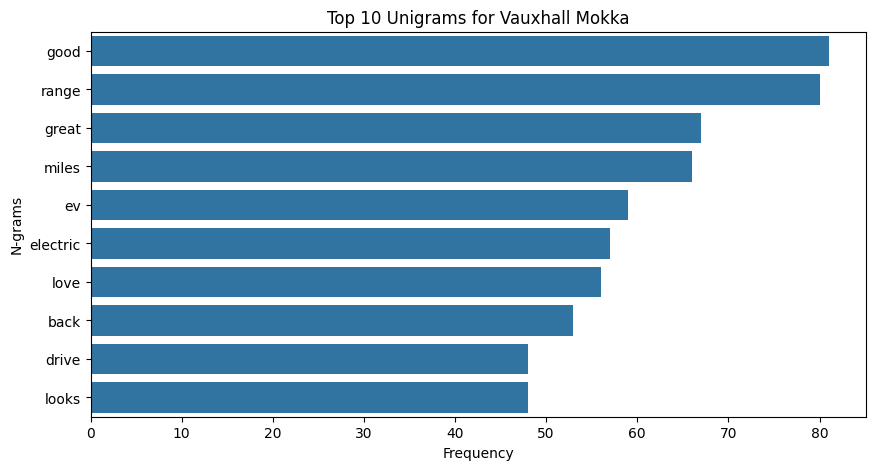

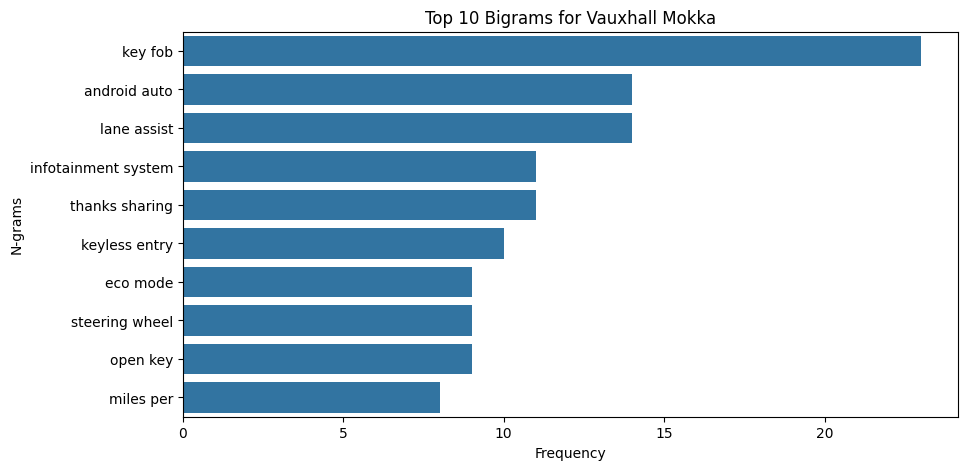

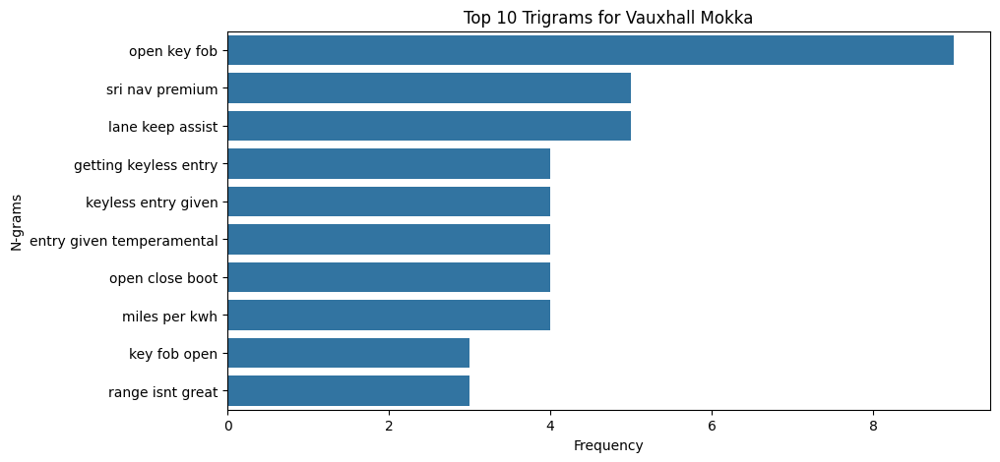

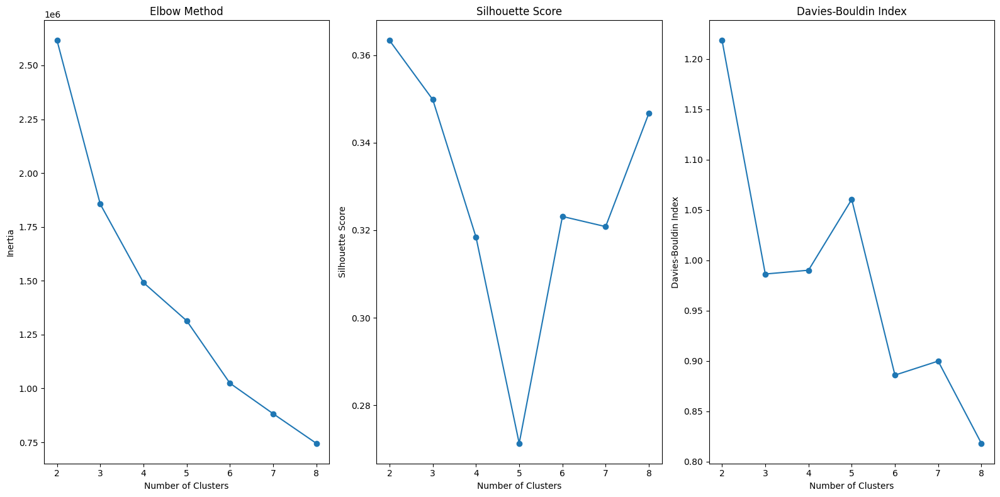

Optimal k values determined by different methods: {'Elbow': 4, 'Silhouette': 2, 'Davies-Bouldin': 8}
Selected optimal number of clusters for Vauxhall Mokka: 8


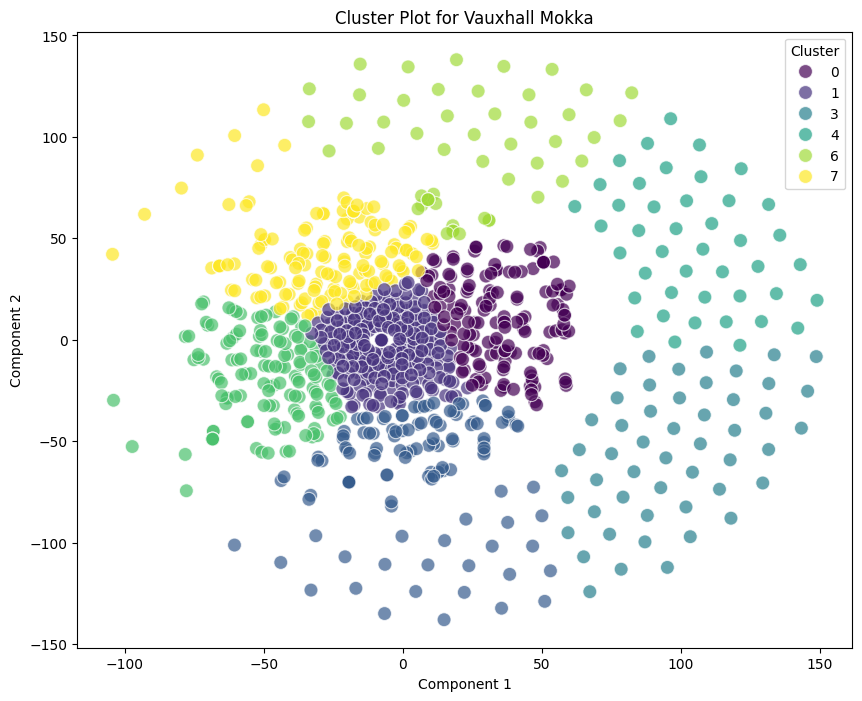

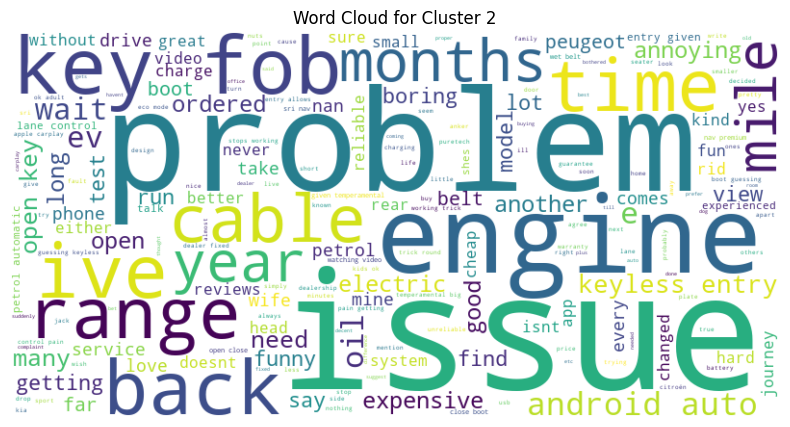

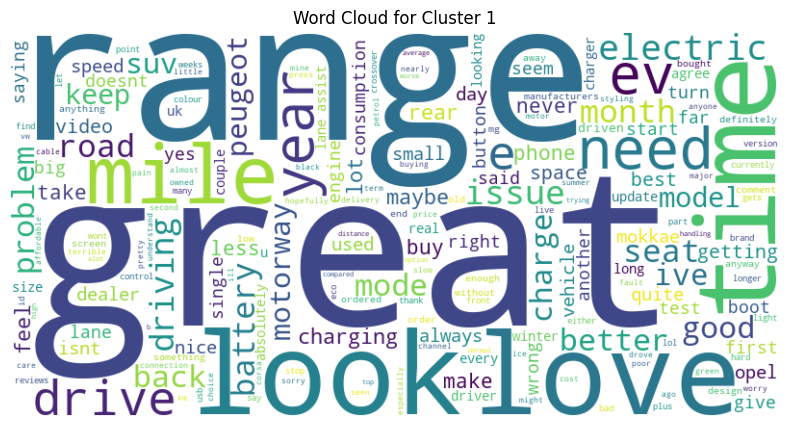

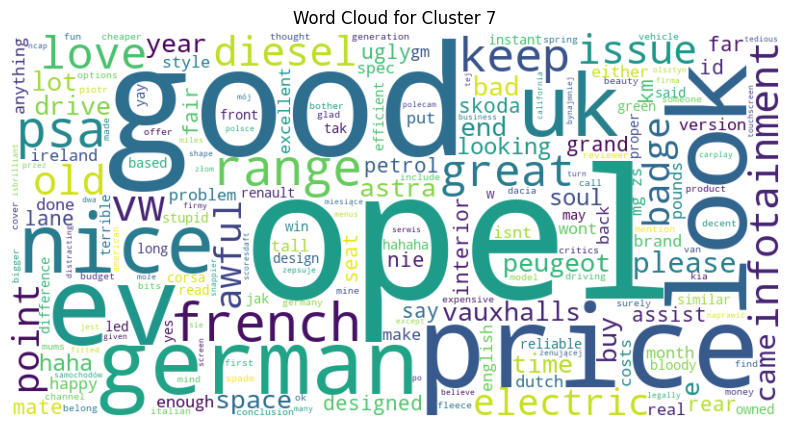

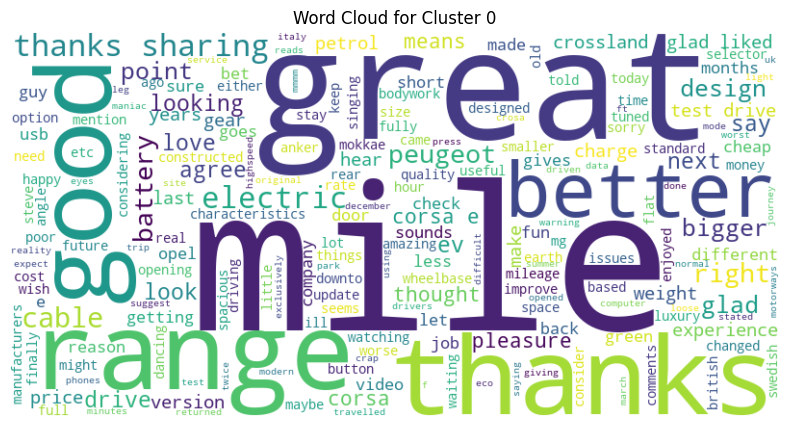

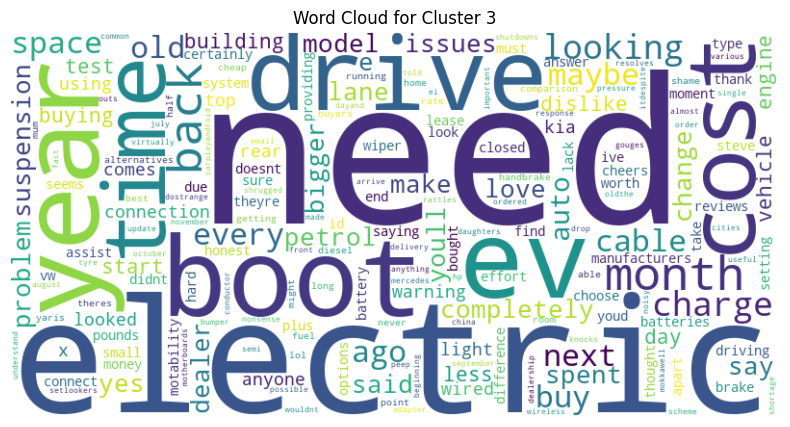

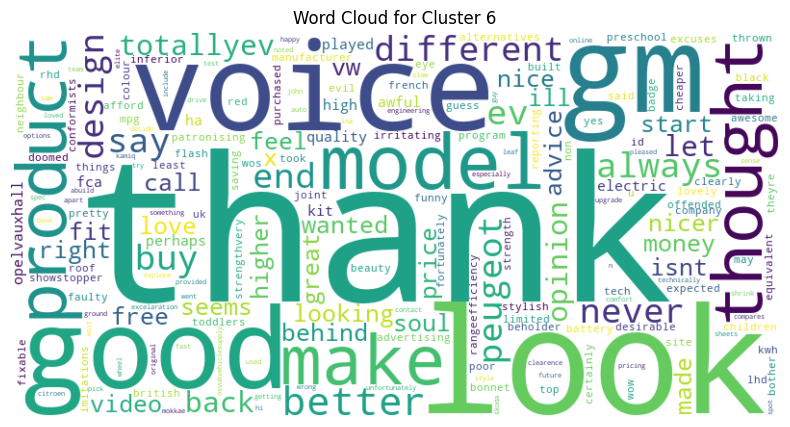

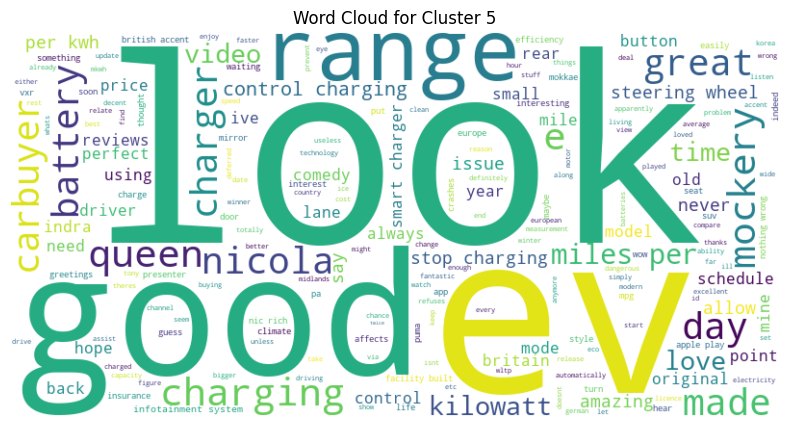

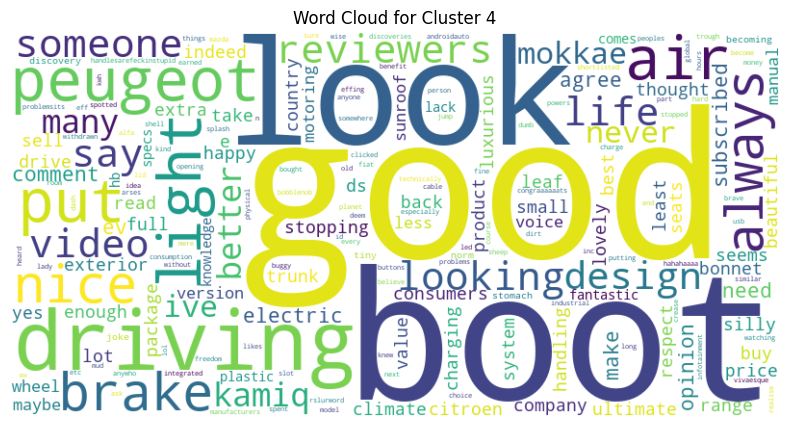

Processing Mini Cooper...


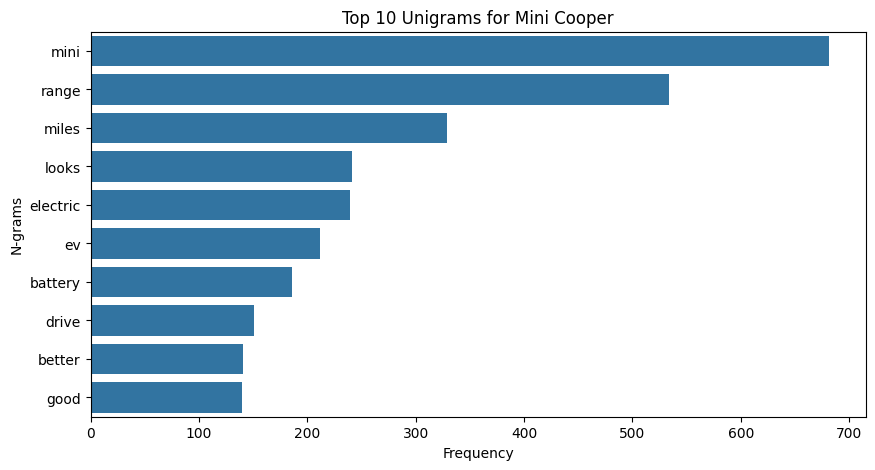

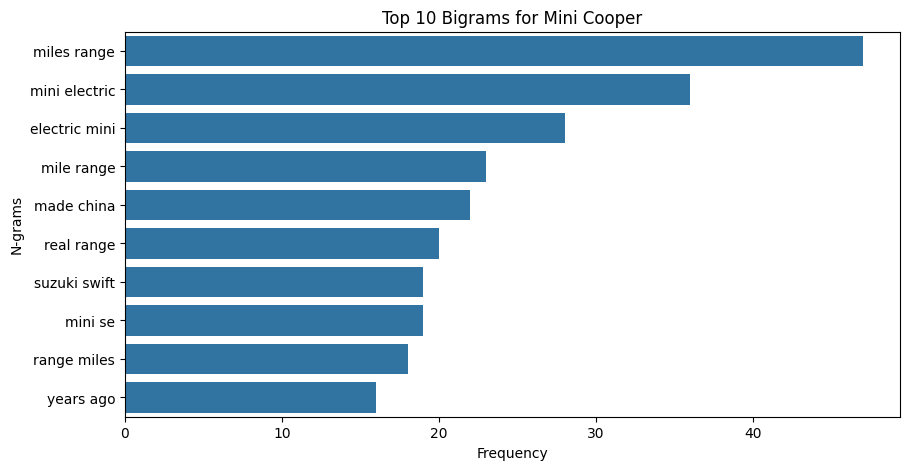

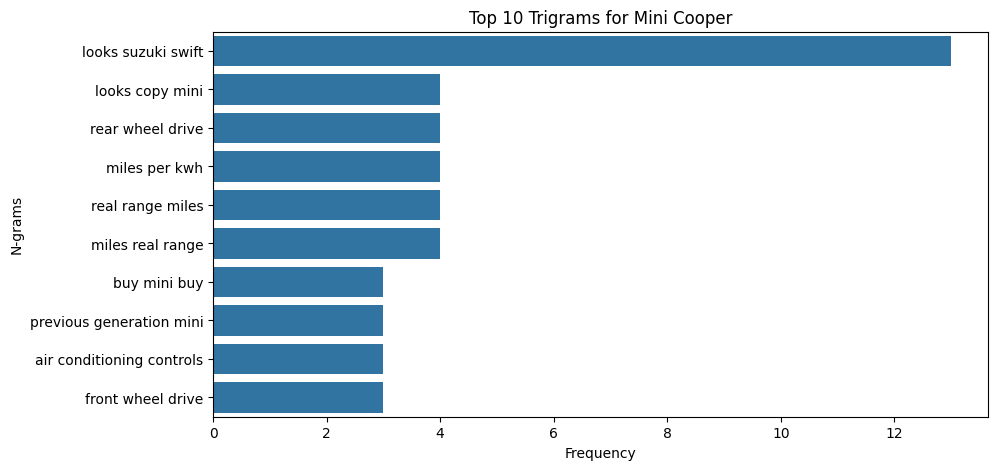

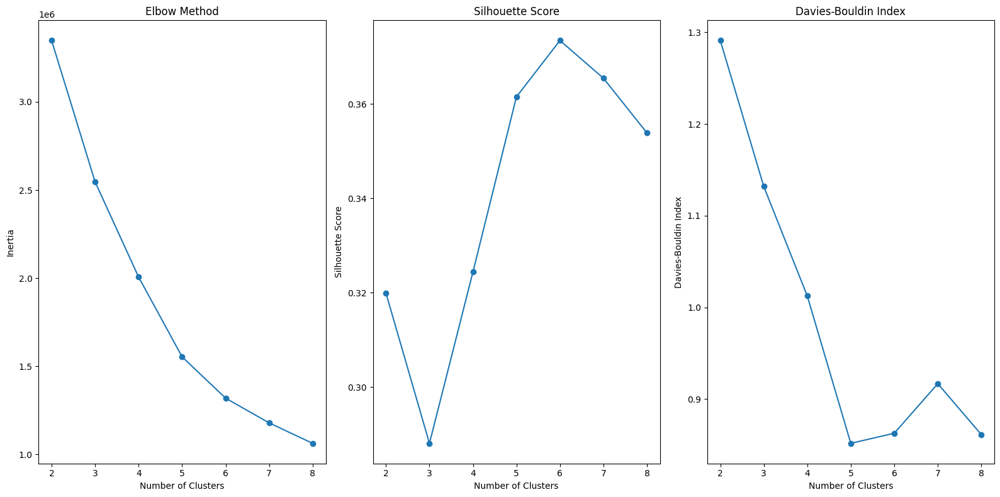

Optimal k values determined by different methods: {'Elbow': 5, 'Silhouette': 6, 'Davies-Bouldin': 5}
Selected optimal number of clusters for Mini Cooper: 5


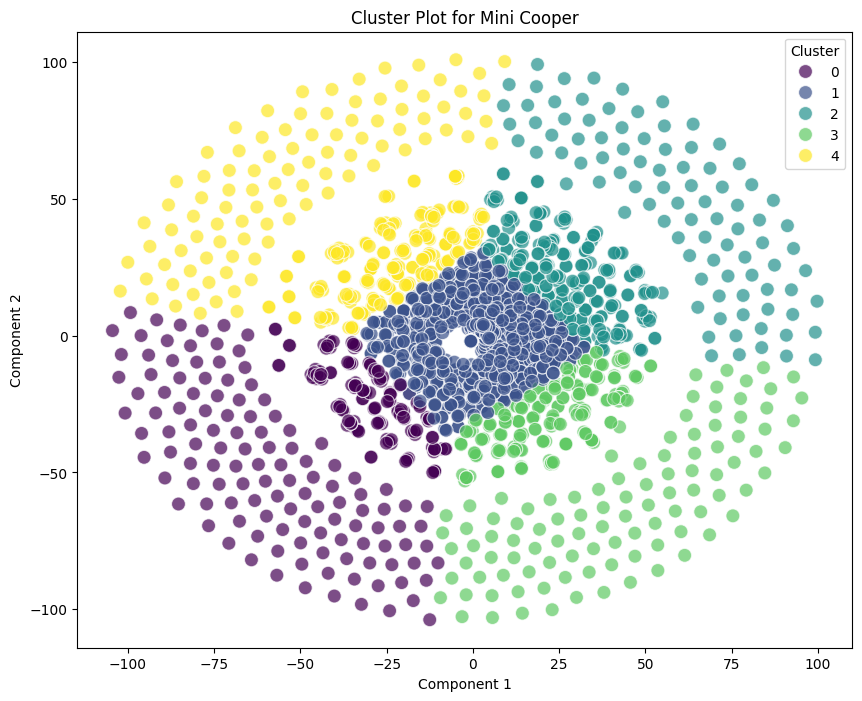

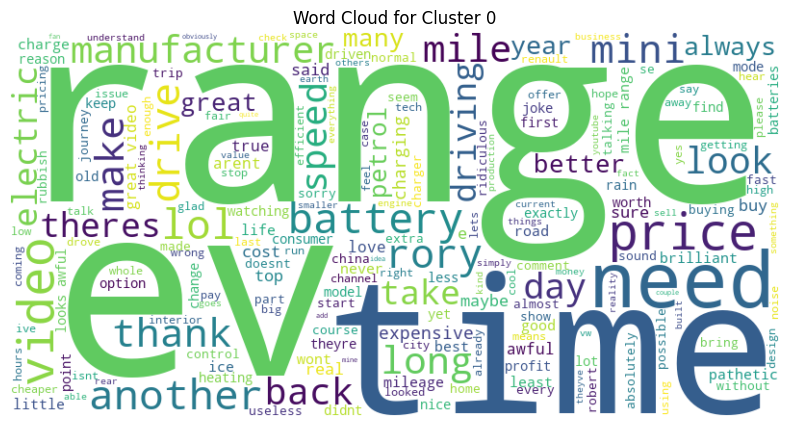

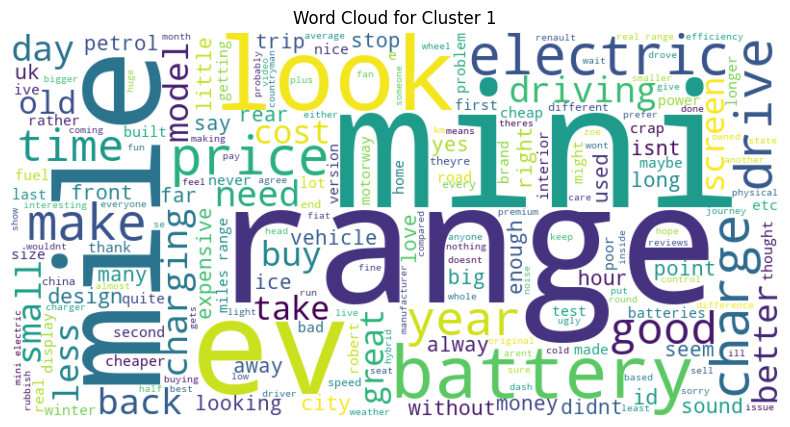

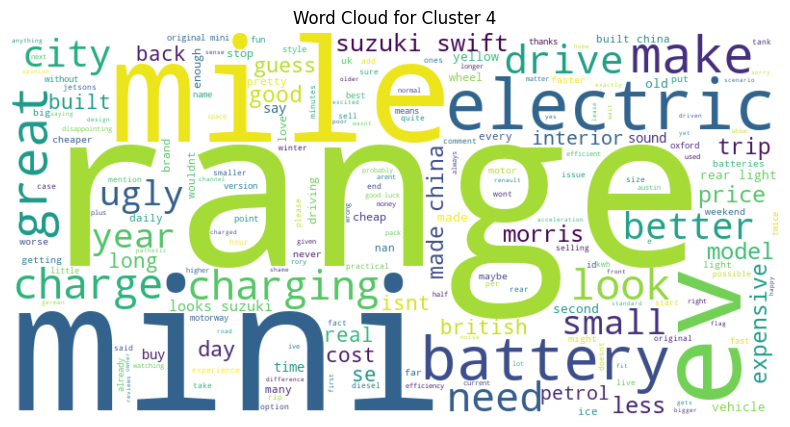

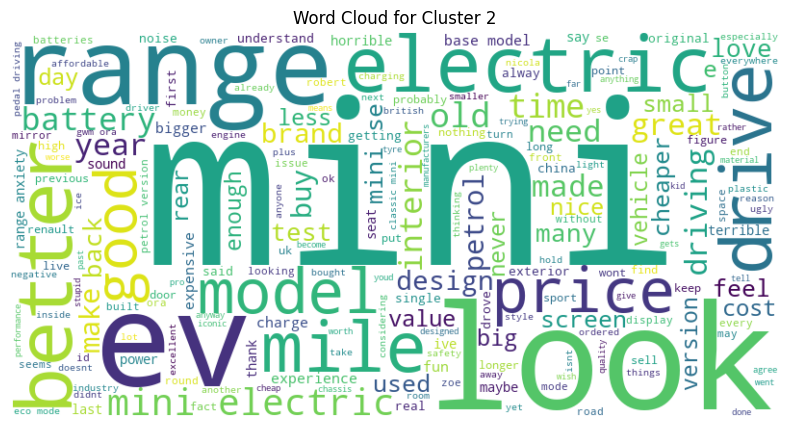

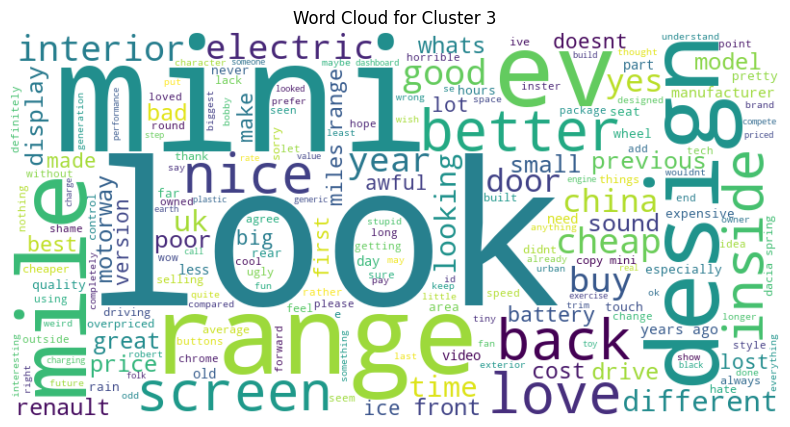

Car: Jeep Avenger
Top comments for each cluster and their sentiment scores:
Cluster 0:
 - where is the rails for bars 
 - go for petrol  youll be missing nothing in terms of car comparison apart from cable charging which is pretty much a headache when you are a busy person
 - good review good explanations but price is too high the touchscreen looks like someone bolted a tv to the dash funny windscreen decals dont sell the car
 - how is the car
 - msjranger no problems with it so far great little car range is around 220 summer 160170 winter motorway driving at 70mph youll get 170miles
 - kalelgreece no problems with it so far great little car range is around 220 summer 160170 winter motorway driving at 70mph youll get 170miles
 - gilestaylor8639 thank you
 - for a honest review watch matt watsons carwow review  oh wait you cant cause it was mysteriously taken down a mere few hours after it went live i saw it though it wasnt glowing 
tell me is this press review car doing the rounds the 

In [212]:
# Perform clustering and analysis for each car
results = {}
for car_name in car_names:
    print(f'Processing {car_name}...')
    try:
        clustered_data, top_comments, sentiment_scores, top_keywords, text_analysis = perform_clustering_and_analyze_text(competitors_data, car_name)
        results[car_name] = {
            'Clustered_Data': clustered_data,
            'Top_Comments': top_comments,
            'Sentiment_Scores': sentiment_scores,
            'Top_Keywords': top_keywords,
            'Text_Analysis': text_analysis
        }
    except ValueError as e:
        print(e)

# Access results
for car_name, result in results.items():
    print(f'Car: {car_name}')
    print('Top comments for each cluster and their sentiment scores:')
    for cluster, comments in result['Top_Comments'].items():
        print(f'Cluster {cluster}:')
        for comment in comments:
            print(f' - {comment}')
        print(f'Sentiment Score: {result["Sentiment_Scores"][cluster]}')
    print('Top Keywords for each cluster:')
    for cluster, keywords in result['Top_Keywords'].items():
        print(f'Cluster {cluster}: {keywords}')
    print('Text Analysis for each cluster:')
    for cluster, analysis in result['Text_Analysis'].items():
        print(f'Cluster {cluster}: {analysis}')



### **Jeep Avenger**
#### **Cluster 0**
- **Top Comments:** 
  - "Where are the rails for bars?"
  - "The price is too high, and the touchscreen looks like someone bolted a TV to the dash."
- **Sentiment Score:** 0.114
- **Keywords:** `ev`, `electric`, `good`, `looks`, `great`
- **Summary:** This cluster contains a mix of neutral to mildly positive comments, with some concerns about the vehicle's price, build quality, and design elements, like the touchscreen. There are also some references to the driving experience and battery performance.

#### **Cluster 1**
- **Top Comments:** 
  - "You spent more time praising the car than telling us the honest details."
  - "Jeep should be ashamed of itself; 2WD and borrowing the name from Dodge."
- **Sentiment Score:** 0.194
- **Keywords:** `video`, `electric`, `real`, `doesn’t`, `best`
- **Summary:** This cluster is primarily critical, with users questioning the authenticity of reviews, the car’s reliability, and its branding. The sentiment is negative, focusing on the perceived over-promotion of the vehicle and doubts about its quality and performance.

#### **Cluster 2**
- **Top Comments:** 
  - "The price is ridiculous for a small car with 4-year-old electric car tech."
  - "Plastic car is obviously a huge mistake."
- **Sentiment Score:** 0.327
- **Keywords:** `price`, `better`, `plastic`, `sustainable`, `quality`
- **Summary:** This cluster is concerned with the vehicle's pricing and the extensive use of plastic. The comments reflect dissatisfaction with the perceived lack of value and environmental sustainability of the Jeep Avenger.

#### **Cluster 3**
- **Top Comments:** 
  - "It needs to be at least 350 miles and a little bit bigger for rear passengers."
  - "The sentiment is completely opposite in North America."
- **Sentiment Score:** 0.159
- **Keywords:** `electric`, `looks`, `price`, `great`, `ev`
- **Summary:** This cluster shows a mixture of mild praise and constructive criticism, focusing on the vehicle's range, size, and market reception, particularly comparing sentiments between regions.

#### **Cluster 4**
- **Top Comments:** 
  - "This car is overpriced, overhyped, and underperforms on every level."
  - "The presence of a lot of plastic can be put down to Fiat being the owner now."
- **Sentiment Score:** 0.124
- **Keywords:** `overpriced`, `plastic`, `bad quality`, `dated`
- **Summary:** The comments in this cluster are largely negative, highlighting issues like the high price, overuse of plastic, and concerns about the car's long-term appeal and quality. The tone is strongly critical, with many users expressing disappointment.

#### **Cluster 5**
- **Top Comments:** 
  - "Towing weight of 0kg makes it useless in Finland."
  - "Looks retro."
- **Sentiment Score:** 0.096
- **Keywords:** `petrol`, `wave`, `wrangler`, `towing`, `mg4`
- **Summary:** This cluster focuses on specific functional aspects, such as towing capacity, which is particularly important in certain regions like Finland. The sentiment is largely negative, with some users expressing dissatisfaction with the vehicle's practicality and functionality.

#### **Cluster 6**
- **Top Comments:** 
  - "Real-world range is just over 200 miles."
  - "It’s too small for America."
- **Sentiment Score:** 0.122
- **Keywords:** `small`, `plastic`, `range`, `winter`, `jeep`
- **Summary:** This cluster contains comments focused on the vehicle's range, size, and suitability for different markets, particularly the US. The sentiment is somewhat negative, with users expressing concerns about the car’s performance in practical scenarios like winter driving.

#### **Cluster 7**
- **Top Comments:** 
  - "Great design, but utterly ridiculous pricing."
  - "Interesting review, but build quality and practicality are disappointing."
- **Sentiment Score:** 0.378
- **Keywords:** `great`, `design`, `price`, `quality`, `practicality`
- **Summary:** This cluster features a mix of positive and negative comments. While some users praise the design and innovation, others criticize the price and build quality. The sentiment is more positive than other clusters, but there are still significant concerns about value for money.



### **Hyundai Kona**
#### **Cluster 0**
- **Top Comments:** 
  - "Seems like a nice car, but probably a bit overpriced compared to rivals."
  - "The central dash is horrific; looks pre-gen, in my opinion."
  - "Looks like a 90s Hyundai, which is not a good thing."
  - "I love the Ioniq 5 personally, but this is horrific despite having less kit."
- **Sentiment Score:** 0.032
- **Keywords:** `good`, `expensive`, `looks`, `vehicle`, `dash`, `battery`
- **Summary:** This cluster presents mixed opinions, with users mostly focusing on the vehicle's pricing and interior design. Some find the car appealing, but the overall sentiment is neutral to slightly negative due to concerns about the dash design and perceived high price. The car’s retro aesthetic also received criticism.

#### **Cluster 1**
- **Top Comments:** 
  - "I have a 2021 Kona Electric; it’s almost 4k more now, and the battery is no better."
  - "I’m a Toyota worshiper, but this just might be my next car."
  - "This car has such a smooth and comfortable drive; it’s so fun to drive."
  - "The interior design looks super nice and clean, which is appealing."
- **Sentiment Score:** 0.151
- **Keywords:** `ev`, `charging`, `electric`, `drive`, `good`, `love`, `interior`
- **Summary:** This cluster is generally positive, highlighting the driving experience, design, and appeal of the Kona. However, there are concerns about the increasing price and lack of battery improvements, which reflect a slight dissatisfaction. Overall, users appreciate the design and driving experience but are wary of the costs.

#### **Cluster 2**
- **Top Comments:** 
  - "The old Kona was faster; I had it for 2 years."
  - "Nice design, but I love the old model more."
  - "Hyundai haven't made the traction control better; instead, they've dropped torque."
  - "The new Kona is slower, and the range isn't as impressive."
- **Sentiment Score:** 0.260
- **Keywords:** `design`, `better`, `quality`, `motor`, `front`, `torque`
- **Summary:** Users in this cluster compare the current model to the older versions, with a focus on design and performance. While there is some appreciation for the new design, the sentiment is moderately positive, with a preference for the previous model and concerns about the current model’s performance and design choices.

#### **Cluster 3**
- **Top Comments:** 
  - "Charging port at the front ruins the look."
  - "This car has no spare tire; I’m not recommending it."
  - "The front design is ugly, and the placement of the charging port is a major fail."
  - "Charging port at the front is a DOA in my book."
- **Sentiment Score:** 0.045
- **Keywords:** `charging`, `port`, `front`, `charge`, `side`, `design`
- **Summary:** This cluster reflects negative opinions focused on specific design flaws and practical issues, such as the placement of the charging port and the absence of a spare tire. The sentiment is largely negative, with users expressing dissatisfaction with these aspects of the Kona’s design and functionality.

#### **Cluster 4**
- **Top Comments:** 
  - "Hyundai have a knack for making cars that look ugly and weird."
  - "It’s unfortunate that the exterior is so ugly, as the drivetrain and interior are substantially improved."
  - "Hyundai cars just look ugly and weird, and this car is no exception."
  - "It’s a pity the exterior is so ugly because everything else seems improved."
- **Sentiment Score:** 0.015
- **Keywords:** `ugly`, `design`, `price`, `exterior`, `looks`, `styling`
- **Summary:** This cluster is highly critical of the car's exterior design. Despite some positive remarks about the drivetrain and interior, the overwhelmingly negative sentiment stems from strong opinions on the car's appearance. Users feel that the unattractive design detracts significantly from the overall appeal of the vehicle.

#### **Cluster 5**
- **Top Comments:** 
  - "Hyundai will find it difficult to sell the new Kona; the Kia Niro just looks so much better."
  - "Old one looks better."
  - "This car is overpriced and doesn't match the competition."
  - "The exterior looks great, but the interior feels outdated and cheap."
- **Sentiment Score:** 0.164
- **Keywords:** `looks`, `better`, `steering`, `price`, `front`, `interior`
- **Summary:** This cluster reflects a preference for the older model, with concerns about the current model’s looks, interior quality, and value for money. The sentiment is moderately negative, with users feeling that competitors like the Kia Niro offer better options at a similar or better price point. The contrast between exterior and interior quality is also a common theme.



### **Peugeot e2008**

#### **Cluster 0**
- **Top Comments:**
  - "Who would buy that for 40k?"
  - "Prefer the petrol version."
  - "Too expensive by about 10k; it's not a dedicated EV platform."
  - "Hideous and electric."
- **Sentiment Score:** 0.201
- **Keywords:** `electric`, `miles`, `energy`, `ev`, `range`, `petrol`
- **Summary:** This cluster is mostly negative, with users criticizing the e2008 for being overpriced and expressing a preference for petrol versions. The sentiment reflects concerns about the car’s value for money and its design, particularly in the context of it being an electric vehicle.

#### **Cluster 1**
- **Top Comments:**
  - "Doesn't have full one-pedal driving, far slower, and low range."
  - "Only petrol and decades later hydrogen."
  - "Just needs a bigger range."
  - "I took delivery of this car this week and noted some annoying quirks."
- **Sentiment Score:** 0.179
- **Keywords:** `range`, `miles`, `charge`, `ev`, `battery`, `model`
- **Summary:** This cluster reflects moderate dissatisfaction, with users pointing out specific shortcomings like the lack of one-pedal driving, insufficient range, and minor annoyances with the car’s functionality. While some users still find it appealing, there is a clear call for improvements, particularly in range and charging capabilities.

#### **Cluster 2**
- **Top Comments:**
  - "The range is pathetic; the Peugeot app is the worst I’ve ever used."
  - "Overpriced and you’d be better off with a Tesla."
  - "Peugeot make nice-looking cars, but they’re expensive and have shocking residuals."
  - "Nice car to drive but let down by poor range and terrible software."
- **Sentiment Score:** 0.198
- **Keywords:** `range`, `ev`, `electric`, `battery`, `peugeot`, `driving`
- **Summary:** This cluster contains a lot of negative feedback focused on the car’s range, high price, and poorly performing software. While the design and driving experience receive some praise, these positives are overshadowed by significant concerns about the car's practicality and overall value, leading to a predominantly negative sentiment.

#### **Cluster 3**
- **Top Comments:**
  - "It's a compromise because it shares a platform with petrol models."
  - "Steel wheels for over 35 grand?"
  - "The front design puts me off, but the interior is nice."
  - "Not as good as the Hyundai Kona."
- **Sentiment Score:** 0.231
- **Keywords:** `peugeot`, `camera`, `good`, `wheel`, `steering`, `gt`
- **Summary:** This cluster presents a mix of opinions. Users appreciate certain aspects like the interior and specific features, but are generally critical of the overall design, platform compromises, and high pricing. The sentiment is cautiously negative, with some positive elements, but overall dissatisfaction due to what users see as a lack of value.

#### **Cluster 4**
- **Top Comments:**
  - "Bought one last week, but the range and price are disappointing."
  - "No thanks, the range is too small for the price."
  - "Just another Stellantis compliance clone."
  - "This refresh doesn't change the fact that it's way overpriced."
- **Sentiment Score:** 0.184
- **Keywords:** `range`, `price`, `better`, `ev`, `thanks`
- **Summary:** This cluster is critical of the e2008's value proposition, focusing on its limited range and high price. Users feel that despite any updates or refreshes, the car remains overpriced and underperforms compared to expectations, leading to a largely negative sentiment.




### **Vauxhall Mokka**

#### **Cluster 0**
- **Top Comments:**
  - "Over 200 miles of range to a reality of 140, that's not good in my eyes."
  - "The Mokka is one of the worst electric cars out there; I could test drive it for an hour and returned it after 20 minutes."
  - "I have a Mokka, not too happy with it; full charge now reads 180 miles instead of 210."
  - "The Mokka is based on the DS3, not the Peugeot 2008, which gives it a poor opening angle on the rear doors."
- **Sentiment Score:** 0.319
- **Keywords:** `range`, `miles`, `battery`, `electric`, `cables`, `good`
- **Summary:** This cluster features a mix of negative and slightly positive feedback, with users generally unhappy about the Mokka's real-world range falling short of expectations and some design issues related to the platform it's built on. While a few users find the car satisfactory, the overall sentiment is predominantly negative, particularly around range and design compromises.

#### **Cluster 1**
- **Top Comments:**
  - "I wonder if they’ve fixed the software problems with a firmware update."
  - "I absolutely detest my Mokka-e and cannot wait for the lease to end."
  - "Who would choose this poor example of an electric car with those range figures?"
  - "My friend picked up his new green electric Mokka; it broke down 4 times in the first 2 weeks."
- **Sentiment Score:** 0.166
- **Keywords:** `range`, `great`, `love`, `looks`, `drive`, `driving`
- **Summary:** This cluster reflects strong dissatisfaction with the Mokka, particularly regarding reliability issues, software problems, and poor range performance. Users express regret over their purchase or lease and compare it unfavorably to other electric vehicles, leading to a largely negative sentiment.

#### **Cluster 2**
- **Top Comments:**
  - "My DAB radio doesn’t work and the local dealership has been unable to fix it for 6 months."
  - "I’ve had it for 3 months and haven’t had the issue with it crashing when navigating via my phone."
  - "Had ours for a little over a year; it’s a great car but small boot and I wish the back doors could open a little more."
  - "It’s a Peugeot product, that’s why it has the problems and weaknesses it has."
- **Sentiment Score:** 0.023
- **Keywords:** `issues`, `problems`, `boot`, `auto`, `range`, `fob`
- **Summary:** This cluster is characterized by user frustration with ongoing issues, particularly related to the car's technology and build quality. Problems with the DAB radio, Android Auto, and other electronic systems dominate the conversation, resulting in a very low sentiment score. While some users find workarounds, the overall sentiment is negative due to persistent issues.

#### **Cluster 3**
- **Top Comments:**
  - "Bought my Mokka-e almost a year ago, and it has spent over a month in the dealership for various issues."
  - "The car is uncomfortable, the suspension feels like you are driving a bouncy castle."
  - "I had lots of problems with Android Auto on my Peugeot e-208, which I believe is technically similar to the Mokka."
  - "Motability scheme order delayed by almost a year due to semiconductor shortages."
- **Sentiment Score:** 0.141
- **Keywords:** `issues`, `drive`, `suspension`, `boot`, `problems`, `android`
- **Summary:** Users in this cluster are dealing with significant problems related to the car’s comfort, reliability, and infotainment system. Complaints about uncomfortable suspension, prolonged dealership visits, and software issues contribute to a predominantly negative sentiment. Delays in vehicle delivery due to supply chain issues further frustrate customers.

#### **Cluster 4**
- **Top Comments:**
  - "Seems to be becoming the norm, take a look at the new Discovery if you can stomach it."
  - "The Vauxhall Mokka: a truly uninspiring design and horrid to drive."
  - "The trunk lid opening slot will be full of dirt and mud in the summer, and snow and ice in the winter."
  - "Vauxhall, Peugeot, Citroen, Fiat, Alfa, DS—all one company now, leading to reduced choice for consumers."
- **Sentiment Score:** 0.303
- **Keywords:** `good`, `boot`, `driving`, `peugeot`, `design`, `plastic`
- **Summary:** This cluster contains a mix of critiques focused on design and practical usability. Users express dissatisfaction with specific design elements like the trunk lid and the overall driving experience. However, there are some acknowledgments of the vehicle’s practical aspects, leading to a slightly more balanced, though still largely negative, sentiment.

#### **Cluster 5**
- **Top Comments:**
  - "For a small car, those miles per kilowatt hour figures are terrible."
  - "We have a Mokka-e and love how it looks and drives, but it has problems with the charging schedule."
  - "There is no facility to automatically stop charging before it reaches 100%, which is not good for the battery."
  - "Most of the issues I've experienced with the car relate to the charging system."
- **Sentiment Score:** 0.224
- **Keywords:** `charging`, `control`, `miles`, `battery`, `charger`, `smart`
- **Summary:** This cluster discusses the technical aspects of the Mokka, particularly related to its charging system. While some users appreciate the design and driving experience, the sentiment is tempered by frustrations with inefficient charging and the lack of control over the charging process, which affects the overall usability of the car.

#### **Cluster 6**
- **Top Comments:**
  - "Very irritating and patronizing voice for a car review."
  - "That always charging to 100% is a showstopper for me; Kona it is then."
  - "I thought Vauxhall was doomed, but since the French took over, it seems to be going from strength to strength."
  - "Still think Vauxhall cars are cheaper imitations of good cars thrown together."
- **Sentiment Score:** 0.269
- **Keywords:** `good`, `voice`, `looks`, `better`, `vauxhall`, `model`
- **Summary:** This cluster reflects mixed feelings about the Mokka, with some users criticizing the car's design and quality while others acknowledge improvements since the company’s acquisition by PSA (Peugeot-Citroen). Sentiment is somewhat neutral, leaning slightly positive, though concerns about the charging process and overall quality persist.

#### **Cluster 7**
- **Top Comments:**
  - "27k miles and no issues at all with my Mokka-e."
  - "From what I have read, its efficiency is similar to that of the Hyundai Ioniq."
  - "Vauxhalls are just rebadged Opels."
  - "The rear space issue is caused by the car being designed to also take a conventional motor."
- **Sentiment Score:** 0.217
- **Keywords:** `opel`, `good`, `price`, `ev`, `french`, `range`
- **Summary:** This cluster is more neutral, with some users reporting no issues after significant use, while others note that the Mokka’s design compromises interior space due to its dual-purpose platform. The sentiment is slightly negative, as the car is often seen as merely a rebadged Opel with some inherent design flaws.



### **Mini Cooper**

#### **Cluster 0**
- **Top Comments:**
  - "Sorry, not sure what they were thinking with the design; it looks awful, like something from the Teletubbies land."
  - "You know how you can control the regen with your right foot? I don’t know what people find in paddles; it’s just a cumbersome gimmick."
  - "This Mini weighs 1680 kg, not over 2000 kg like you said."
  - "A great and detailed review; I cannot disagree with the consumer frustration with changes that we all hate."
- **Sentiment Score:** 0.120
- **Keywords:** `range`, `video`, `time`, `need`, `battery`, `awful`
- **Summary:** This cluster reflects a generally negative sentiment towards the Mini Cooper, particularly regarding its design, which many find unappealing and gimmicky. There’s also some skepticism about the weight and practicality of the car. While some comments appreciate the detailed review, the overall tone is one of disappointment, particularly with the design and certain features like the regenerative braking paddles.

#### **Cluster 1**
- **Top Comments:**
  - "Heating and cooling controls need to be physical buttons or dials; automakers, please stop burying them in the screens."
  - "Why is this reviewer so negative towards this new Mini JO1? I’m really baffled by some of his comments."
  - "Can this Mini be charged to 100% like the old model, or does it now have the advice to charge to 80% like the newer BMW i models?"
  - "Electric Honda E is a better small cute hatchback, in my opinion."
- **Sentiment Score:** 0.112
- **Keywords:** `range`, `mini`, `miles`, `battery`, `looks`, `electric`
- **Summary:** This cluster shows a mix of criticism and concern, particularly around the user interface, with many expressing a preference for physical buttons over touchscreen controls. Some users are puzzled by the reviewer's negativity, while others compare the Mini unfavorably to other electric vehicles like the Honda E. The sentiment here is mostly negative, driven by frustrations with design choices and skepticism about the car’s overall value.

#### **Cluster 2**
- **Top Comments:**
  - "It looks horrible; how do these designers get away with it? Doesn’t deserve the Mini badge."
  - "More EV sht."
  - "An electric Mini Cooper S? John Cooper would be turning in his grave."
  - "I drove the new electric Mini S in JCW trim last Saturday in the UK—loved it. It was plenty fast enough, and the build quality was impressive."
- **Sentiment Score:** 0.131
- **Keywords:** `mini`, `electric`, `range`, `looks`, `better`, `ev`
- **Summary:** This cluster has a polarized sentiment, with strong negative reactions to the design and the idea of an electric Mini. Some long-time Mini enthusiasts feel that the brand’s character has been lost. However, there are also positive remarks about the driving experience and build quality, particularly from users who have tested the car. Despite some positive feedback, the overall sentiment leans negative due to disappointment with the design and brand direction.

#### **Cluster 3**
- **Top Comments:**
  - "These milk floats are faster, quieter, more refined, and have instant torque."
  - "It looks nice; the vast majority of folk who already buy the Mini will just buy this."
  - "It looks like it was made and designed in China; previous model is way more classy."
  - "What on earth have they done? It looks like someone called China and described a Mini down the phone."
- **Sentiment Score:** 0.113
- **Keywords:** `mini`, `looks`, `range`, `miles`, `design`, `cheap`
- **Summary:** This cluster reflects a mixed sentiment with users either appreciating the evolution of the Mini's design or criticizing it for losing its original charm. Some users acknowledge the car’s improved performance, while others are disappointed by what they see as a cheap, uninspired design that lacks the quality and character of previous models. The sentiment is primarily negative, with concerns about the car’s manufacturing and design choices.

#### **Cluster 4**
- **Top Comments:**
  - "Looks like a Suzuki Swift; does not scream Mini."
  - "So ugly."
  - "Mini now built in China? Just assumed it was made in the UK."
  - "Oh, how the British car companies have fallen; this is now made in China too."
  - "The built-in-China complaints are a bit daft; Apple products are made in China."
- **Sentiment Score:** 0.137
- **Keywords:** `range`, `mini`, `miles`, `electric`, `china`, `ugly`
- **Summary:** This cluster has a strong focus on the car's manufacturing origins, with many users expressing disappointment that the Mini is now built in China. This has led to negative perceptions about quality and design. However, some users dismiss these concerns as irrelevant, pointing out that many high-quality products are also made in China. The overall sentiment is negative, driven by concerns about the car’s perceived loss of British identity and the shift in manufacturing.



## Sentiment Distribution Across Car Models

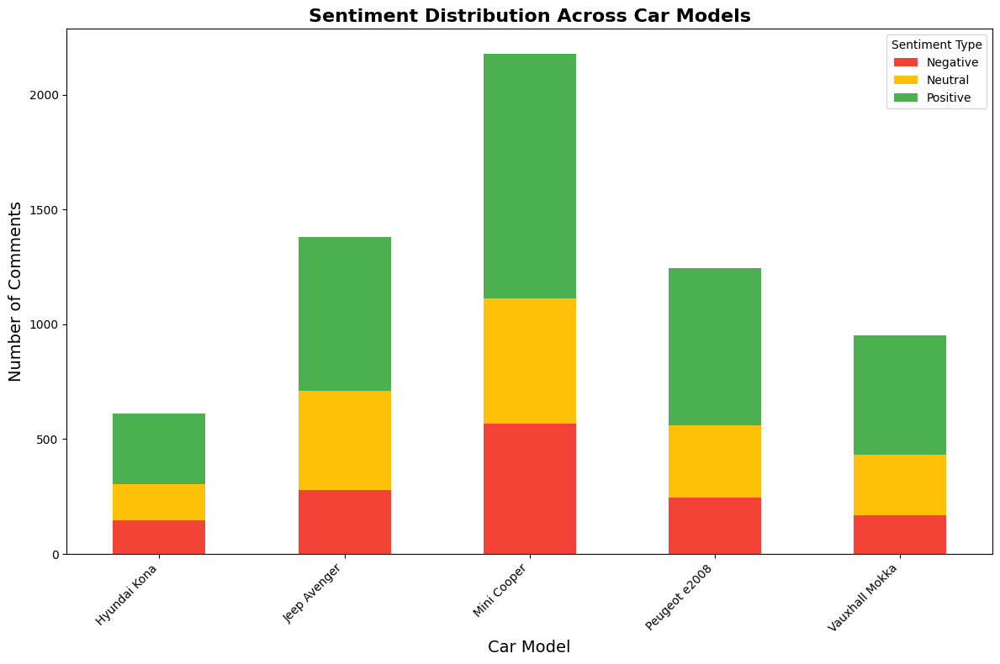

In [213]:
# Function to classify the sentiment
def get_sentiment(text):
    analysis = TextBlob(text)
    if analysis.sentiment.polarity > 0:
        return 'Positive'
    elif analysis.sentiment.polarity == 0:
        return 'Neutral'
    else:
        return 'Negative'
    
# Remove rows with NaN or non-string values in the 'Text' column
competitors_data = competitors_data.dropna(subset=['Text'])
competitors_data = competitors_data[competitors_data['Text'].apply(lambda x: isinstance(x, str))]

# Apply sentiment analysis to the text column
competitors_data['Sentiment_Type'] = competitors_data['Text'].apply(get_sentiment)

# Group by car model and sentiment type, then count the occurrences
sentiment_distribution = competitors_data.groupby(['Car', 'Sentiment_Type']).size().unstack().fillna(0)

# Define a more vibrant custom color palette
custom_palette = {
    'Positive': '#4CAF50',  # A lively green
    'Neutral': '#FFC107',   # A vibrant amber
    'Negative': '#F44336',  # A strong red
}

# Plot the sentiment distribution with custom colors
sentiment_distribution.plot(kind='bar', stacked=True, figsize=(12, 8), color=[custom_palette.get(x) for x in sentiment_distribution.columns])

plt.title('Sentiment Distribution Across Car Models', fontsize=16, fontweight='bold')
plt.xlabel('Car Model', fontsize=14)
plt.ylabel('Number of Comments', fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.legend(title='Sentiment Type')
plt.tight_layout()

plt.show()

# Analysis of Sentiment Change from Pre-Launch to Post-Launch Period for Fiat 600e Competitors

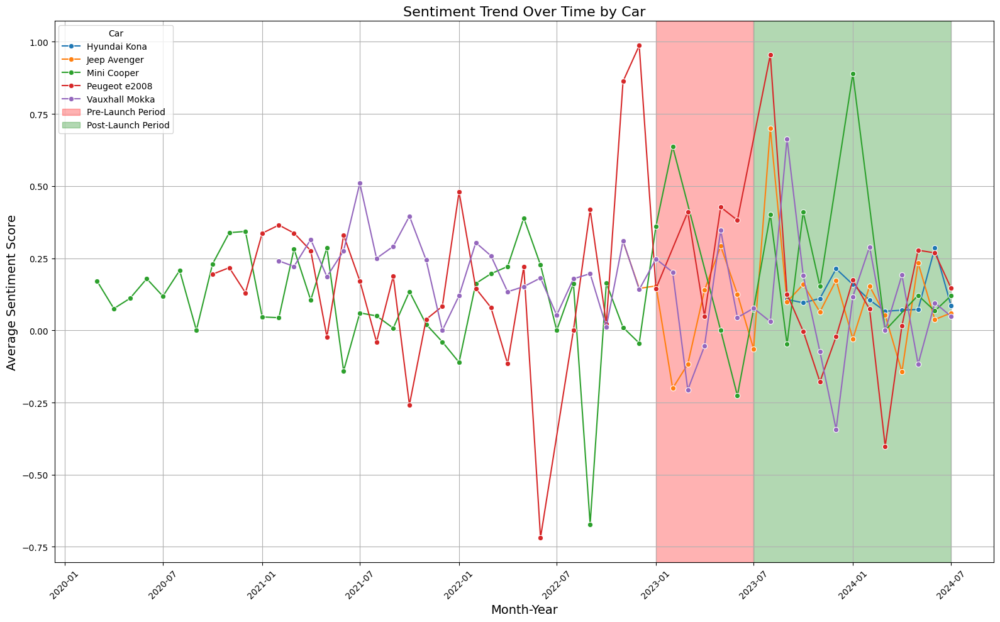

Sentiment Change from Pre-Launch to Post-Launch Period:
Car
Jeep Avenger      0.064425
Mini Cooper       0.042105
Peugeot e2008    -0.163205
Vauxhall Mokka   -0.005534
Hyundai Kona      0.124666
Name: Sentiment_Score, dtype: float64
Jeep Avenger: Sentiment improved by 0.06 after the launch of Fiat 600e.
Mini Cooper: Sentiment improved by 0.04 after the launch of Fiat 600e.
Peugeot e2008: Sentiment declined by -0.16 after the launch of Fiat 600e.
Vauxhall Mokka: Sentiment declined by -0.01 after the launch of Fiat 600e.
Hyundai Kona: Sentiment improved by 0.12 after the launch of Fiat 600e.


In [214]:

# Initialize Sentiment Analyzer
sia = SentimentIntensityAnalyzer()

# Convert 'Date' to datetime, invalid parsing will be set as NaT (Not a Time)
competitors_data['Date'] = pd.to_datetime(competitors_data['Date'], errors='coerce')

# Drop rows where 'Date' could not be parsed into a valid datetime
competitors_data = competitors_data.dropna(subset=['Date'])

# Function to compute sentiment scores
def compute_sentiment(text):
    return sia.polarity_scores(text)['compound']

# Apply sentiment analysis to the dataset
competitors_data['Sentiment_Score'] = competitors_data['Text'].apply(compute_sentiment)

# Group by 'Car' and Month-Year to compute the average sentiment over time
competitors_data['Month-Year'] = competitors_data['Date'].dt.to_period('M')

# Calculate the mean sentiment score for each car by month-year
monthly_sentiment = competitors_data.groupby(['Car', 'Month-Year'])['Sentiment_Score'].mean().reset_index()

# Convert Month-Year back to datetime for better plotting
monthly_sentiment['Month-Year_Start'] = monthly_sentiment['Month-Year'].dt.start_time

# Plotting the sentiment trend over month-year for each competitor
plt.figure(figsize=(16, 10))
sns.lineplot(data=monthly_sentiment, x='Month-Year_Start', y='Sentiment_Score', hue='Car', marker='o')

# Title and labels
plt.title('Sentiment Trend Over Time by Car', fontsize=16)
plt.xlabel('Month-Year', fontsize=14)
plt.ylabel('Average Sentiment Score', fontsize=14)

# Define the launch date of Fiat 600e
launch_date = pd.to_datetime('2023-07-01')

# Mark the pre-launch and post-launch periods
pre_launch_start = launch_date - pd.DateOffset(months=6)
post_launch_end = launch_date + pd.DateOffset(months=12)

plt.axvspan(pre_launch_start, launch_date, color='red', alpha=0.3, label='Pre-Launch Period')
plt.axvspan(launch_date, post_launch_end, color='green', alpha=0.3, label='Post-Launch Period')

plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='Car')
plt.tight_layout()
plt.show()

# Calculate the sentiment difference between pre-launch and post-launch periods
pre_launch_sentiment = monthly_sentiment[(monthly_sentiment['Month-Year_Start'] >= pre_launch_start) & 
                                         (monthly_sentiment['Month-Year_Start'] < launch_date)].groupby('Car')['Sentiment_Score'].mean()

post_launch_sentiment = monthly_sentiment[(monthly_sentiment['Month-Year_Start'] > launch_date) & 
                                          (monthly_sentiment['Month-Year_Start'] <= post_launch_end)].groupby('Car')['Sentiment_Score'].mean()

# Handle cases where data is missing in either pre-launch or post-launch
# For Hyundai Kona, calculate only the post-launch sentiment if pre-launch data is missing
if 'Hyundai Kona' not in pre_launch_sentiment.index:
    hyundai_sentiment_change = post_launch_sentiment.get('Hyundai Kona', None)
else:
    hyundai_sentiment_change = post_launch_sentiment.get('Hyundai Kona', 0) - pre_launch_sentiment.get('Hyundai Kona', 0)

# Filter out any cars that do not have data in both periods
valid_cars = pre_launch_sentiment.dropna().index.intersection(post_launch_sentiment.dropna().index)

# Calculate sentiment differences only for valid cars
sentiment_difference = post_launch_sentiment[valid_cars] - pre_launch_sentiment[valid_cars]

# Add Hyundai Kona sentiment change if it is available
if hyundai_sentiment_change is not None:
    sentiment_difference['Hyundai Kona'] = hyundai_sentiment_change

# Output the sentiment difference analysis
print("Sentiment Change from Pre-Launch to Post-Launch Period:")
print(sentiment_difference)

# Analyze the effect of the Fiat 600e launch
for car, diff in sentiment_difference.items():
    if diff > 0:
        print(f"{car}: Sentiment improved by {diff:.2f} after the launch of Fiat 600e.")
    else:
        print(f"{car}: Sentiment declined by {diff:.2f} after the launch of Fiat 600e.")

## Understanding the negative sentiments

In [215]:
# Initialise VADER sentiment analyzer
sia = SentimentIntensityAnalyzer()

# Analyse emotions
def get_emotion(text):
    scores = sia.polarity_scores(text)
    if scores['compound'] > 0.05:
        return 'positive'
    elif scores['compound'] < -0.05:
        return 'negative'
    else:
        return 'neutral'

# Apply to the dataset
competitors_data['Emotion'] = competitors_data['Text'].apply(get_emotion)

# Filter negative sentiments
negative_comments = competitors_data[competitors_data['Emotion'] == 'negative']

# Display some of the negative comments
print(negative_comments['Text'].sample(10))

2831    john as mentioned that 99 is all about statist...
227         because they desperately need a selling point
3807    are the electric versions a pain  are they act...
1294    sobecause you like jeep as a brand this  becau...
3495    200 miles on a charge waste of time these car ...
482     enough with this electric nonsense lithium is ...
4912    i really find it wild that i am still watching...
2354    panzerkami2381 yeah the id3 is what i would ac...
1652    saw one yesterday those lights on front and ba...
5960    wgroenen7468 not sure how true this is for thi...
Name: Text, dtype: object


In [216]:
# Categorise the negative comments 
def categorize_comment(text):
    text = text.lower()
    
    if any(keyword in text for keyword in ['battery', 'charge', 'charging', 'range', 'battery life']):
        return 'Battery/Charging'
    elif any(keyword in text for keyword in ['driving', 'one pedal', 'steering', 'handling', 'performance']):
        return 'Driving Experience'
    elif any(keyword in text for keyword in ['price', 'expensive', 'overprice', 'cost', 'value']):
        return 'Pricing'
    elif any(keyword in text for keyword in ['quality', 'made', 'build', 'construction', 'durability']):
        return 'Build Quality'
    elif any(keyword in text for keyword in ['tech', 'features', 'technology', 'software', 'update']):
        return 'Technology/Features'
    elif any(keyword in text for keyword in ['comfort', 'seating', 'seat', 'cushion', 'legroom']):
        return 'Comfort'
    elif any(keyword in text for keyword in ['safety', 'safe', 'unsafe', 'accident', 'crash']):
        return 'Safety'
    elif any(keyword in text for keyword in ['customer service', 'support', 'help', 'service', 'after-sales']):
        return 'Customer Service/Support'
    elif any(keyword in text for keyword in ['user-friendly', 'interface', 'navigation', 'controls', 'buttons']):
        return 'Usability'
    

# Apply categorisation
negative_comments['Category'] = negative_comments['Text'].apply(categorize_comment)

# Display category distribution
category_distribution = negative_comments['Category'].value_counts()
print(category_distribution)

Category
Battery/Charging            358
Pricing                     105
Driving Experience           61
Build Quality                50
Comfort                      29
Technology/Features          20
Customer Service/Support     14
Usability                    14
Safety                       11
Name: count, dtype: int64


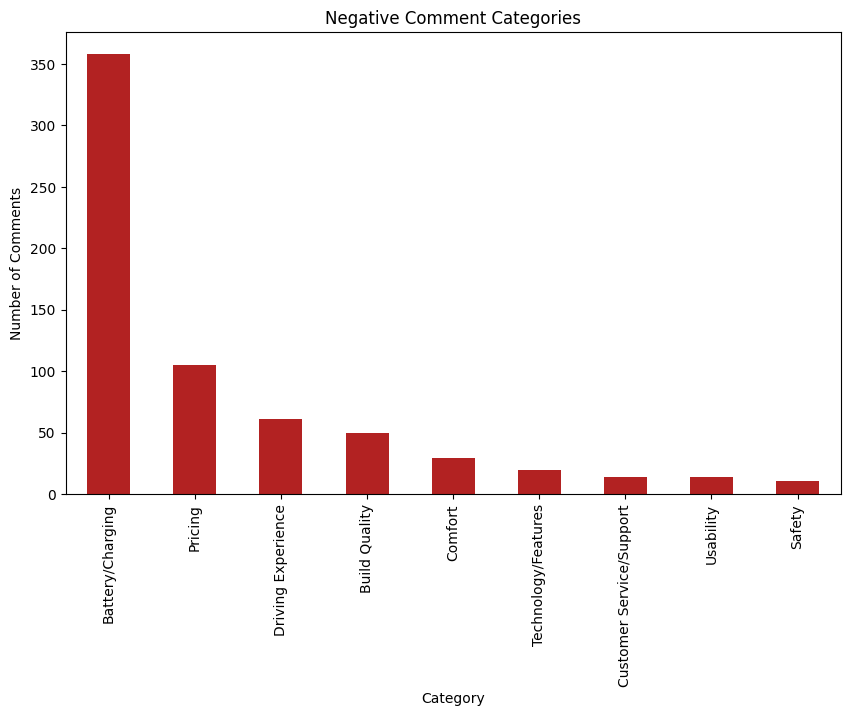

In [217]:
# Plot the category distribution
plt.figure(figsize=(10, 6))
category_distribution.plot(kind='bar', color='firebrick')
plt.title('Negative Comment Categories')
plt.xlabel('Category')
plt.ylabel('Number of Comments')
# Remove grid and set transparent background
plt.grid(False)
plt.gca().patch.set_alpha(0.0)
plt.show()

## Customer Journey Analysis for Competitor Data

In [218]:

# Define the stemmer
stemmer = PorterStemmer()

# Define journey keywords
consideration_keywords = [
        'thinking about buying', 'considering', 'heard about', 'looking into', 'interested in', 'thinking of', 'exploring', 'exploring options', 'curious about', 'potential purchase', 
    'contemplating', 'researching', 'initial thoughts', 'first impression', 'early stages', 'test drive', 'review', 'comparison', 'evaluating', 'checking out', 
    'comparing models', 'reading reviews', 'weighing options', 'pros and cons', 'in-depth analysis', 'performance review', 'customer feedback', 'expert opinion',
    'considering purchase', 'considering buying', 'considering options', 'considering alternatives', 'considering different models', 'considering different brands',
    'interest', 'interested in purchasing', 'learning about', 'reading about', 'looking at', 'deciding', 'analyzing', 'debating', 'discover', 'learn', 'understand', 
    'notice', 'recognize', 'find', 'seek', 'know', 'identify', 'realize', 'consider', 'observe', 'uncover', 'detect', 'watch', 'listen', 'aware', 'curiosity', 'investigate', 'look for', 'browse', 
    'survey', 'familiarize', 'acknowledge', 'perceive', 'enlighten', 'examine', 'catch sight of', 'encounter', 'gain insight', 'illuminate', 'introduce', 'join', 'participate', 'pay attention', 'probe', 'review', 
    'scan', 'scrutinize', 'search', 'seek out', 'study', 'test', 'view', 'engage with', 'witness', 'inquire about', 'delve into', 'get to know', 'inform oneself', 'catch wind of', 'unearth', 'inspect', 'spot', 
    'catch glimpse of', 'gain knowledge of', 'contextualize', 'sense', 'learn about', 'get acquainted with', 'see', 'be exposed to', 'be mindful of', 'get wind of', 'be conscious of', 'note', 
    'catch', 'perceive', 'digest', 'behold', 'monitor', 'figure out'

    ]

purchase_keywords = [
        'just purchased', 'bought', 'ordered', 'got my', 'finally decided', 'finally bought', 'finally purchased', 'finally ordered', 'finally got', 'finally made the decision',
    'new car', 'went ahead', 'completed purchase', 'made the purchase', 'made the decision', 'made the order', 'made the buy', 'made the choice', 'made the commitment', 
    'loving my new car', 'enjoying', 'happy with', 'satisfied with', 'impressed with',  'excited about', 'thrilled with', 'delighted with', 'pleased with', 'content with','recommend', 'would buy again', 'would purchase again', 'would recommend', 'owning',
    'i ordered', 'complete purchase', 'purchased completely', 'bought completely', 'got my hands on', 'purchase online', 'just bought', 'got my new', 'shipped', 'picked up', 'acquired', 'receiving', 'ordering', 
    'ordered a', 'buying', 'picking up', 'received', 'will receive', 'enjoying my', 'i got', 'using', 'experiencing', 'after purchase', 'i own','owned', 'driving', 'having', 'leasing', 'lease', 'buy', 'order', 
    'purchase', 'acquire', 'get', 'obtain', 'secure', 'checkout',  'invest in', 'procure', 'take', 'reserve', 'add to cart', 'pay for', 'confirm', 'buy now', 'place order', 'enroll', 
    'sign up', 'book', 'submit order', 'redeem', 'commit to buy', 'make a deal', 'settle on', 'choose', 'pick', 'select', 'go for', 'accept offer', 'agree to buy', 'lock in purchase', 
    'execute transaction', 'cash out', 'shop for', 'bid', 'make payment', 'engage services', 'claim', 'rent', 'hire', 'appoint', 'schedule', 'preorder', 'layaway', 
    'put a down payment', 'opt for', 'get hold of', 'settle payment', 'put in order', 'put money down', 'agree to terms', 'contract', 'enter into agreement', 'take ownership', 'wrap up sale', 
    'engage', 'part with money', 'buy in-store', 'sign contract', 'procure services', 'call for delivery', 'obtain goods', 'swap for', 'exchange for', 'barter for', 'click to buy', 'press to purchase', 'subscribe', 'join membership'
    ]
    
disinterest_keywords = [
        'not interested', 'never buy', 'wouldn’t buy', 'don’t care', 'not for me', 'too expensive', 'overpriced', 'not worth it', 'disappointed', 'no way', 
    'waste of money', 'never', 'avoid', 'won’t consider', 'poor value', 'expensive','do not want', 'not buying', 'not like', 'hate', 'would not consider', 'no interest', 'uninterested', 
    'reject', 'decline', 'dislike', 'no thanks', 'not a fan', 'would rather not', 'no need', 'no plan to buy', 'no intention', 'skip', 'waste of time', 'not convinced', 'not worth the money', 
    'no value', 'no point', 'not interested in buying', 'not worth the price', 'pass on this', 'not my style', 'not my thing',
    'not my taste', 'not my preference', 'disinterest', 'no desire', 'no plan', 'no intention to buy', 'would not buy'
    ]

# Function to preprocess the text
def preprocess_text(text):
    # Convert to lowercase
    text = text.lower()
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Tokenize the text
    tokens = word_tokenize(text)
    # Remove stopwords
    tokens = [word for word in tokens if word not in stopwords.words('english')]
    # Join tokens back into a string
    return ' '.join(tokens)

# Apply the preprocessing to create a 'Processed_Text' column
competitors_data['Processed_Text'] = competitors_data['Text'].apply(preprocess_text)

    Journey_Stage  Sentiment
0   consideration   0.267477
1  not interested  -0.000908
2        purchase   0.143828


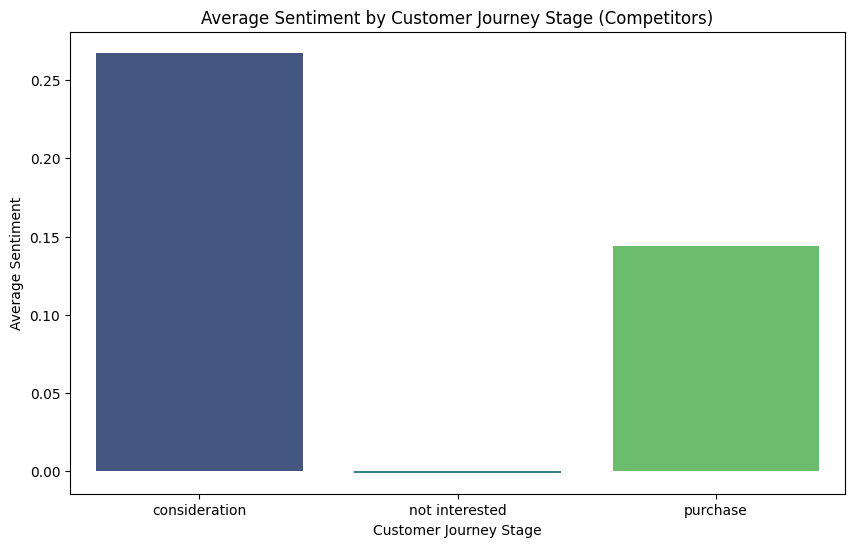

In [219]:
# Function to assign journey stage
def assign_journey_stage(text):
    text = text.lower()
    for keyword in consideration_keywords:
        if keyword in text:
            return 'consideration'
    for keyword in purchase_keywords:
        if keyword in text:
            return 'purchase'
    for keyword in disinterest_keywords:
        if keyword in text:
            return 'not interested'
    return None  # Assign None if no match

# Apply the function to assign journey stages
competitors_data['Journey_Stage'] = competitors_data['Text'].apply(assign_journey_stage)

# Remove rows where Journey_Stage is None (i.e., where it was 'other')
competitors_data = competitors_data.dropna(subset=['Journey_Stage'])


# Initialise the VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Function to calculate sentiment
def get_sentiment(text):
    return sid.polarity_scores(text)['compound']

# Apply sentiment analysis
competitors_data['Sentiment'] = competitors_data['Text'].apply(get_sentiment)

# Group by Journey_Stage and calculate mean sentiment
stage_sentiment_comments = competitors_data.groupby('Journey_Stage')['Sentiment'].mean().reset_index()
print(stage_sentiment_comments)

# Plot the sentiment by journey stage for potential customers
plt.figure(figsize=(10, 6))
sns.barplot(x='Journey_Stage', y='Sentiment', data=stage_sentiment_comments, palette='viridis')
plt.title('Average Sentiment by Customer Journey Stage (Competitors)')
plt.xlabel('Customer Journey Stage')
plt.ylabel('Average Sentiment')
# Remove grid and set transparent background
plt.grid(False)
plt.gca().patch.set_alpha(0.0)
plt.show()

**1.Consideration (0.267477):**
The consideration stage shows the highest average sentiment, indicating that potential customers are generally positive and interested when evaluating the competitors.
This suggests that during the early stages of the buyer journey, the competitors successfully generate interest and favorable impressions.

**2.Not Interested (-0.000908):**
The sentiment in the "not interested" stage is close to neutral but slightly negative, indicating some dissatisfaction or lack of appeal among those who decide not to consider the competitors.
This slight negativity may point to unmet expectations or factors that deter potential buyers.

**3.Purchase (0.143828):**
The purchase stage has a moderately positive sentiment, showing that customers are relatively satisfied after making a purchase from the competitors.
However, the sentiment is lower than the consideration stage, suggesting that while the purchase decision is positive, there may be areas for improvement post-purchase.

<Figure size 1400x800 with 0 Axes>

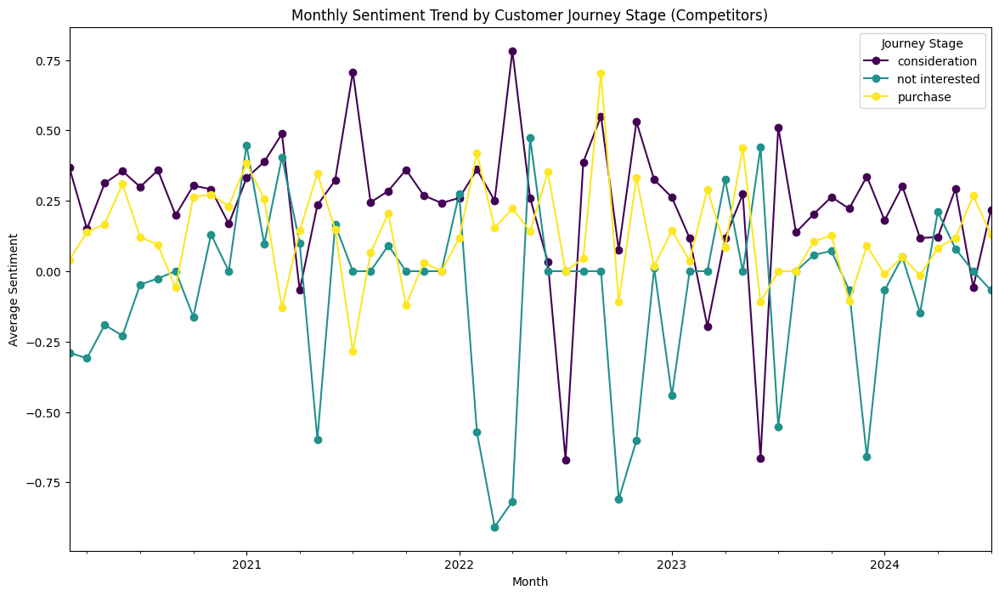

In [220]:
# Timeline analysis
# Extract month and year from the Date
competitors_data['Month'] = competitors_data['Date'].dt.to_period('M')

# Group by Month and Journey_Stage, and calculate mean sentiment
monthly_stage_sentiment = competitors_data.groupby(['Month', 'Journey_Stage'])['Sentiment'].mean().unstack().fillna(0)

# Plot the monthly sentiment trend by journey stage
plt.figure(figsize=(14, 8))
monthly_stage_sentiment.plot(kind='line', marker='o', colormap='viridis', figsize=(14, 8))
plt.title('Monthly Sentiment Trend by Customer Journey Stage (Competitors)')
plt.xlabel('Month')
plt.ylabel('Average Sentiment')
plt.legend(title='Journey Stage')
# Remove grid and set transparent background
plt.grid(False)
plt.gca().patch.set_alpha(0.0)
plt.show()

**1.Consideration Stage:**
The sentiment in the consideration stage remains consistently positive, with several peaks indicating periods of high customer interest. However, there are noticeable dips, particularly in early 2022 and mid-2023, suggesting that potential buyers may have encountered concerns or negative perceptions during these times.
The generally positive sentiment in this stage shows that competitors' offerings are initially appealing, but the dips might reflect market shifts, emerging issues, or comparisons with other brands like the Fiat 600e.

**2.Purchase Stage:**
Sentiment during the purchase stage fluctuates more than during consideration, with both significant peaks and troughs. This suggests that while many customers are satisfied post-purchase, there are periods of dissatisfaction, possibly related to product performance or unmet expectations.
The sharp fluctuations might indicate that although customers are convinced enough to buy, their post-purchase experience varies widely, which could make them open to switching to alternatives like the Fiat 600e.

**3.Not Interested Stage:**
The sentiment in the "not interested" stage is generally negative, with some deep troughs, particularly noticeable in 2022. This persistent negativity reflects a strong disinterest or dissatisfaction among a subset of customers, potentially due to pricing, features, or overall brand perception.
The negative sentiment in this stage underscores a potential opportunity for Fiat 600e to attract customers who are disillusioned with competitors, especially during the times when sentiment is at its lowest.

## Word Cloud Generation by Sentiment for each stage 

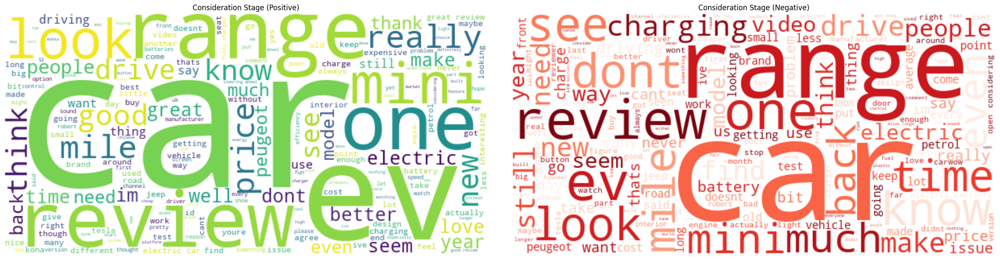

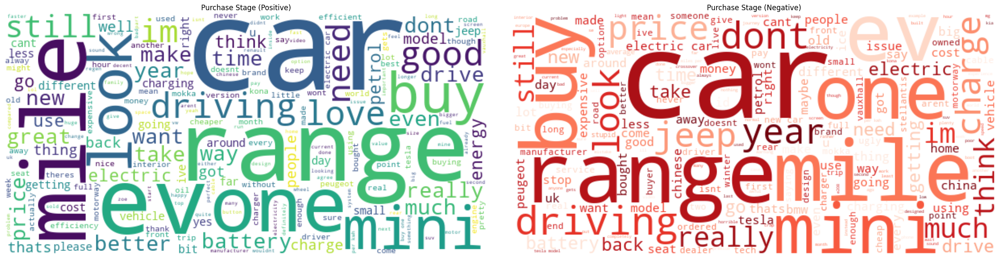

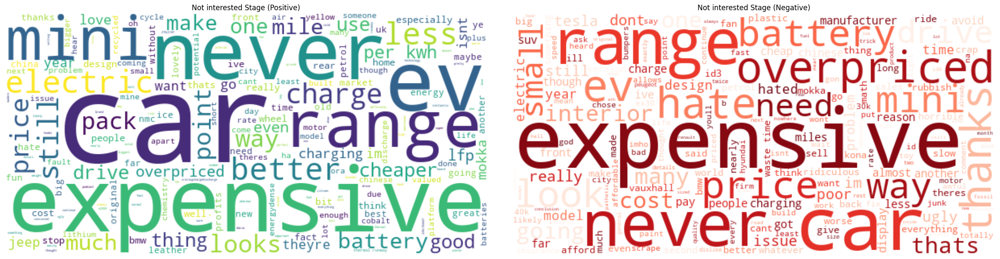

In [221]:
# Function to generate and display word clouds per journey stage and sentiment
def generate_word_clouds_by_sentiment(data, stage):
    # Filter positive and negative data
    positive_data = data[(data['Journey_Stage'] == stage) & (data['Sentiment'] > 0)]
    negative_data = data[(data['Journey_Stage'] == stage) & (data['Sentiment'] <= 0)]
    
    # Generate word clouds with rectangular dimensions
    positive_text = ' '.join(positive_data['Processed_Text'])
    negative_text = ' '.join(negative_data['Processed_Text'])
    
    positive_wordcloud = WordCloud(width=600, height=300, background_color='white').generate(positive_text)
    negative_wordcloud = WordCloud(width=600, height=300, background_color='white', colormap='Reds').generate(negative_text)
    
    # Plot side by side
    fig, axes = plt.subplots(1, 2, figsize=(24, 6)) 
    
    axes[0].imshow(positive_wordcloud, interpolation='bilinear')
    axes[0].axis('off')
    axes[0].set_title(f'{stage.capitalize()} Stage (Positive)')
    
    axes[1].imshow(negative_wordcloud, interpolation='bilinear')
    axes[1].axis('off')
    axes[1].set_title(f'{stage.capitalize()} Stage (Negative)')
    
    plt.tight_layout()
    plt.show()

# Generate word clouds for each journey stage
for stage in ['consideration', 'purchase', 'not interested']:
    generate_word_clouds_by_sentiment(competitors_data, stage)
